# **Insurance Claims- Fraud Detection**

**Problem Statement:**

Business case:

Insurance fraud is a huge problem in the industry. It's difficult to identify fraud claims. Machine Learning is in a unique position to help the Auto Insurance industry with this problem.

In this project, you are provided a dataset which has the details of the insurance policy along with the customer details. It also has the details of the accident on the basis of which the claims have been made. 

In this example, you will be working with some auto insurance data to demonstrate how you can create a predictive model that predicts if an insurance claim is fraudulent or not. 

In [1]:
# Importing all necessary libraries and packages 
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import warnings
warnings.filterwarnings('ignore')

In [2]:
#Importing the CSV file of the Dataset
Fraud = pd.read_csv('/content/drive/MyDrive/Python_Datasets/Automobile_insurance_fraud.csv')

In [3]:
#Examining the Data
Fraud

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
995,3,38,941851,16-07-1991,OH,500/1000,1000,1310.80,0,431289,FEMALE,Masters,craft-repair,paintball,unmarried,0,0,22-02-2015,Single Vehicle Collision,Front Collision,Minor Damage,Fire,NC,Northbrook,6045 Andromedia St,20,1,YES,0,1,?,87200,17440,8720,61040,Honda,Accord,2006,N,NaN
996,285,41,186934,05-01-2014,IL,100/300,1000,1436.79,0,608177,FEMALE,PhD,prof-specialty,sleeping,wife,70900,0,24-01-2015,Single Vehicle Collision,Rear Collision,Major Damage,Fire,SC,Northbend,3092 Texas Drive,23,1,YES,2,3,?,108480,18080,18080,72320,Volkswagen,Passat,2015,N,NaN
997,130,34,918516,17-02-2003,OH,250/500,500,1383.49,3000000,442797,FEMALE,Masters,armed-forces,bungie-jumping,other-relative,35100,0,23-01-2015,Multi-vehicle Collision,Side Collision,Minor Damage,Police,NC,Arlington,7629 5th St,4,3,?,2,3,YES,67500,7500,7500,52500,Suburu,Impreza,1996,N,NaN
998,458,62,533940,18-11-2011,IL,500/1000,2000,1356.92,5000000,441714,MALE,Associate,handlers-cleaners,base-jumping,wife,0,0,26-02-2015,Single Vehicle Collision,Rear Collision,Major Damage,Other,NY,Arlington,6128 Elm Lane,2,1,?,0,1,YES,46980,5220,5220,36540,Audi,A5,1998,N,NaN


In [4]:
#After importing the data, to learn more about the dataset, we’ll use .head() .info() and .describe() methods
Fraud.head()

,months_as_customer,age,policy_number,policy_bind_date,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_date,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_location,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported,_c39
0,328,48,521585,17-10-2014,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,25-01-2015,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,9935 4th Drive,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y,NaN
1,228,42,342868,27-06-2006,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,21-01-2015,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,6608 MLK Hwy,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y,NaN
2,134,29,687698,06-09-2000,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,22-02-2015,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7121 Francis Lane,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N,NaN
3,256,41,227811,25-05-1990,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,10-01-2015,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,6956 Maple Drive,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y,NaN
4,228,44,367455,06-06-2014,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,17-02-2015,Vehicle Theft,?,Minor Damage,None,NY,Arlington,3041 3rd Ave,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N,NaN


In [5]:
#Information about the Dataset
Fraud.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 40 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   months_as_customer           1000 non-null   int64  
 1   age                          1000 non-null   int64  
 2   policy_number                1000 non-null   int64  
 3   policy_bind_date             1000 non-null   object 
 4   policy_state                 1000 non-null   object 
 5   policy_csl                   1000 non-null   object 
 6   policy_deductable            1000 non-null   int64  
 7   policy_annual_premium        1000 non-null   float64
 8   umbrella_limit               1000 non-null   int64  
 9   insured_zip                  1000 non-null   int64  
 10  insured_sex                  1000 non-null   object 
 11  insured_education_level      1000 non-null   object 
 12  insured_occupation           1000 non-null   object 
 13  insured_hobbies    

**Observation :** 
We have both object and numerical values present in the Dataset and fraud_reported is our target variable in which we have classes .

In [6]:
#Shape of the Dataset ?
Fraud.shape

(1000, 40)

**Observation :**

We have 1000 rows i.e, instances of Fraud and 40 columns i.e, specifications like injury_claim , property_claim , vehicle_claim etc .

In [7]:
#Check description about get to know minimum value, max value, standard deviation etc.
Fraud.describe()

,months_as_customer,age,policy_number,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,capital-gains,capital-loss,incident_hour_of_the_day,number_of_vehicles_involved,bodily_injuries,witnesses,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_year,_c39
count,1000.000000,1000.000000,1000.000000,1000.000000,1000.000000,1.000000e+03,1000.000000,1000.000000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.00000,1000.000000,1000.000000,1000.000000,1000.000000,0.0
mean,203.954000,38.948000,546238.648000,1136.000000,1256.406150,1.101000e+06,501214.488000,25126.100000,-26793.700000,11.644000,1.83900,0.992000,1.487000,52761.94000,7433.420000,7399.570000,37928.950000,2005.103000,NaN
std,115.113174,9.140287,257063.005276,611.864673,244.167395,2.297407e+06,71701.610941,27872.187708,28104.096686,6.951373,1.01888,0.820127,1.111335,26401.53319,4880.951853,4824.726179,18886.252893,6.015861,NaN
min,0.000000,19.000000,100804.000000,500.000000,433.330000,-1.000000e+06,430104.000000,0.000000,-111100.000000,0.000000,1.00000,0.000000,0.000000,100.00000,0.000000,0.000000,70.000000,1995.000000,NaN
25%,115.750000,32.000000,335980.250000,500.000000,1089.607500,0.000000e+00,448404.500000,0.000000,-51500.000000,6.000000,1.00000,0.000000,1.000000,41812.50000,4295.000000,4445.000000,30292.500000,2000.000000,NaN
50%,199.500000,38.000000,533135.000000,1000.000000,1257.200000,0.000000e+00,466445.500000,0.000000,-23250.000000,12.000000,1.00000,1.000000,1.000000,58055.00000,6775.000000,6750.000000,42100.000000,2005.000000,NaN
75%,276.250000,44.000000,759099.750000,2000.000000,1415.695000,0.000000e+00,603251.000000,51025.000000,0.000000,17.000000,3.00000,2.000000,2.000000,70592.50000,11305.000000,10885.000000,50822.500000,2010.000000,NaN
max,479.000000,64.000000,999435.000000,2000.000000,2047.590000,1.000000e+07,620962.000000,100500.000000,0.000000,23.000000,4.00000,2.000000,3.000000,114920.00000,21450.000000,23670.000000,79560.000000,2015.000000,NaN


**Observation**

1. The mean of months_as_customer is 203.95 and the mode is 199.50. The range is 0 - 479 and IQR is 115.75 - 276.25.
2. The mean of age is 38.95 and the mode is 38. The range of age is 19 - 64 and IQR is 32 - 44.
3. The mean of policy_deductable is 1136 and the mode is 1000. The range of policy_deductable is 500 - 2000 and IQR is also 500 - 2000.

In [8]:
#Columns_list
Fraud.columns

Index(['months_as_customer', 'age', 'policy_number', 'policy_bind_date',
       'policy_state', 'policy_csl', 'policy_deductable',
       'policy_annual_premium', 'umbrella_limit', 'insured_zip', 'insured_sex',
       'insured_education_level', 'insured_occupation', 'insured_hobbies',
       'insured_relationship', 'capital-gains', 'capital-loss',
       'incident_date', 'incident_type', 'collision_type', 'incident_severity',
       'authorities_contacted', 'incident_state', 'incident_city',
       'incident_location', 'incident_hour_of_the_day',
       'number_of_vehicles_involved', 'property_damage', 'bodily_injuries',
       'witnesses', 'police_report_available', 'total_claim_amount',
       'injury_claim', 'property_claim', 'vehicle_claim', 'auto_make',
       'auto_model', 'auto_year', 'fraud_reported', '_c39'],
      dtype='object')

In [9]:
#Count Unique values in each attribute
Fraud.apply(lambda x: len(x.unique()))

months_as_customer              391
age                              46
policy_number                  1000
policy_bind_date                951
policy_state                      3
policy_csl                        3
policy_deductable                 3
policy_annual_premium           991
umbrella_limit                   11
insured_zip                     995
insured_sex                       2
insured_education_level           7
insured_occupation               14
insured_hobbies                  20
insured_relationship              6
capital-gains                   338
capital-loss                    354
incident_date                    60
incident_type                     4
collision_type                    4
incident_severity                 4
authorities_contacted             5
incident_state                    7
incident_city                     7
incident_location              1000
incident_hour_of_the_day         24
number_of_vehicles_involved       4
property_damage             

**Observation :**
There is one useless feature named as _c39 , so we should drop it as this attribute has missing values only 

In [3]:
#Droping _c39 column
Fraud.drop(['_c39'],axis=1,inplace=True)

In [11]:
#Checking value_counts of Target Variable
Fraud['fraud_reported'].value_counts()

N    753
Y    247
Name: fraud_reported, dtype: int64

**Observation :**

Fraud has not been reported in 753 cases while Fraud has been reported in 247 cases .

In [12]:
#Checking for Null Values 
Fraud.isnull().sum()

months_as_customer             0
age                            0
policy_number                  0
policy_bind_date               0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_date                  0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_location              0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_rep

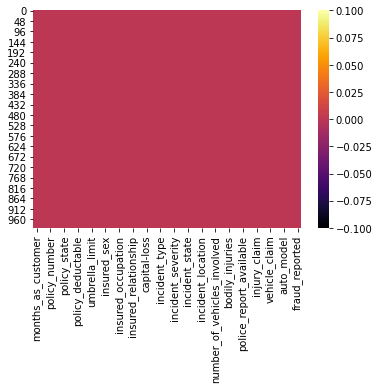

In [13]:
#Checking for Null values by passing a HeatMap Function
sns.heatmap(Fraud.isnull(),cmap='inferno')

**Observation :**
This is a very clean Dataset because there are no null values present in the Dataset .

**Separating Categorical and Continous columns**

In [4]:
#Categorical_Columns
c = (Fraud.dtypes == 'object')
category_cols = list(c[c].index)
print(category_cols)

['policy_bind_date', 'policy_state', 'policy_csl', 'insured_sex', 'insured_education_level', 'insured_occupation', 'insured_hobbies', 'insured_relationship', 'incident_date', 'incident_type', 'collision_type', 'incident_severity', 'authorities_contacted', 'incident_state', 'incident_city', 'incident_location', 'property_damage', 'police_report_available', 'auto_make', 'auto_model', 'fraud_reported']


In [5]:
#Continous_Columns
c = (Fraud.dtypes == 'int64')
continous_cols = list(c[c].index)
continous_cols.append('policy_annual_premium')  # this column is only float type
print(continous_cols)

['months_as_customer', 'age', 'policy_number', 'policy_deductable', 'umbrella_limit', 'insured_zip', 'capital-gains', 'capital-loss', 'incident_hour_of_the_day', 'number_of_vehicles_involved', 'bodily_injuries', 'witnesses', 'total_claim_amount', 'injury_claim', 'property_claim', 'vehicle_claim', 'auto_year', 'policy_annual_premium']


# **EDA(Exploratory Data Analysis)**

**1.Univariant_Analysis**

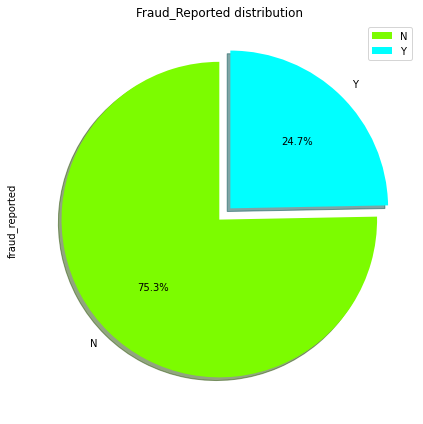

In [16]:
f, ax = plt.subplots(figsize=(8, 6))
order = list(Fraud['fraud_reported'].value_counts().index)

colors = ['lawngreen','cyan']
explode = (0,0.1)
Fraud['fraud_reported'].value_counts().plot.pie(explode=explode , colors = colors ,startangle=90 ,autopct='%.1f%%',shadow=True, ax=ax)
ax.set_title('Fraud_Reported distribution');
ax.legend(loc = "upper right") 
plt.tight_layout() 
plt.show()

**Observation**

1. 75.3% constitutes no fraud_reported
2. 24.75% constitutes fraud_reported

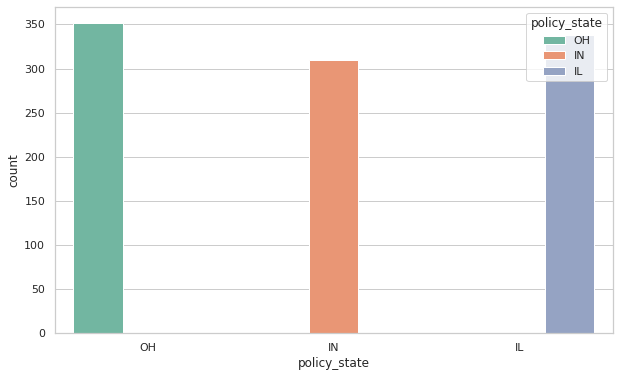

In [17]:
#Plotting Countplot for every Attributes

# Plotting policy_state Distribution
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10,6))
sns.countplot(x='policy_state',data=Fraud,hue='policy_state',saturation=.75,palette='Set2')
plt.show()

**Highest no. of policy_state lies in OH**

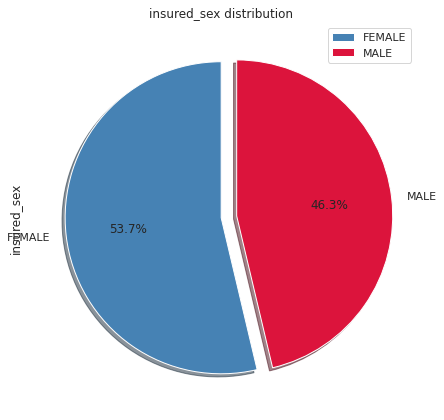

In [18]:
f, ax = plt.subplots(figsize=(8, 6))
order = list(Fraud['insured_sex'].value_counts().index)

colors = ['steelblue','crimson']
explode = (0,0.1)
Fraud['insured_sex'].value_counts().plot.pie(explode=explode , colors = colors ,startangle=90 ,autopct='%.1f%%',shadow=True, ax=ax)
ax.set_title('insured_sex distribution');
ax.legend(loc = "upper right") 
plt.tight_layout() 
plt.show()

**Female perons constitutes 53.7% and male constitutes of 46.3%.**

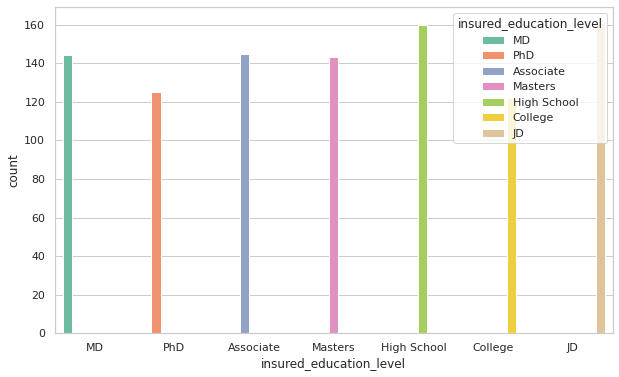

In [19]:
# Plotting insured_education_level Distribution
sns.set_theme(style="whitegrid")
plt.figure(figsize=(10,6))
sns.countplot(x='insured_education_level',data=Fraud,hue='insured_education_level',saturation=.85,palette='Set2')
plt.show()

**Above plot shows distribution of education_level**

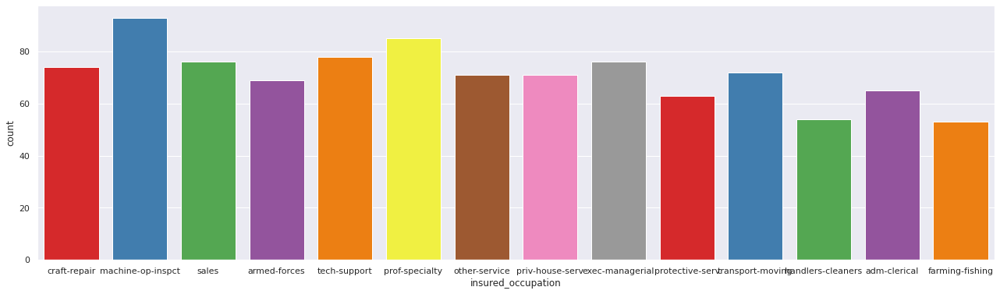

In [20]:
# Plotting insured_occupation Distribution
sns.set_theme(style="darkgrid")
plt.figure(figsize=(22,6))
sns.countplot(x='insured_occupation',data=Fraud,saturation=.85,palette='Set1')
plt.show()

**Above plot shows distibution plot of insured_occupation.**

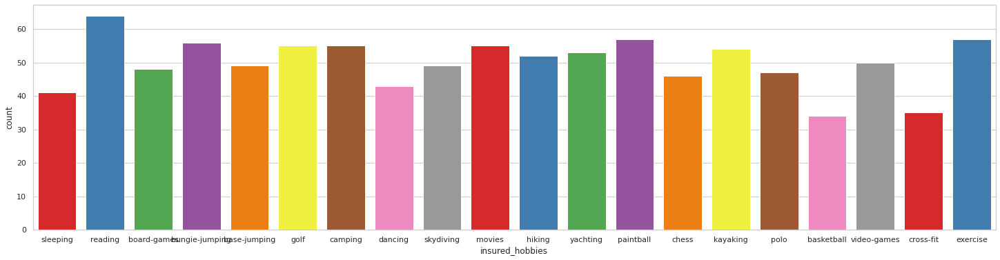

In [21]:
# Plotting insured_hobbies Distribution
sns.set_theme(style="whitegrid")
plt.figure(figsize=(25,6))
sns.countplot(x='insured_hobbies',data=Fraud,saturation=.85,palette='Set1')
plt.show()

**Above plot shows distribution of insured_hobbies**

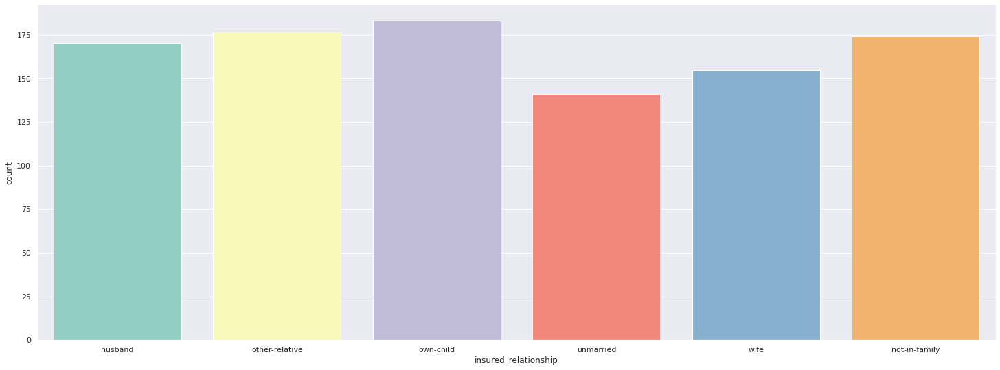

In [22]:
# Plotting insured_relationship Distribution
sns.set_theme(style="darkgrid")
plt.figure(figsize=(25,9))
sns.countplot(x='insured_relationship',data=Fraud,saturation=.85,palette='Set3')
plt.show()

In [23]:
Fraud['collision_type'].value_counts()

Rear Collision     292
Side Collision     276
Front Collision    254
?                  178
Name: collision_type, dtype: int64

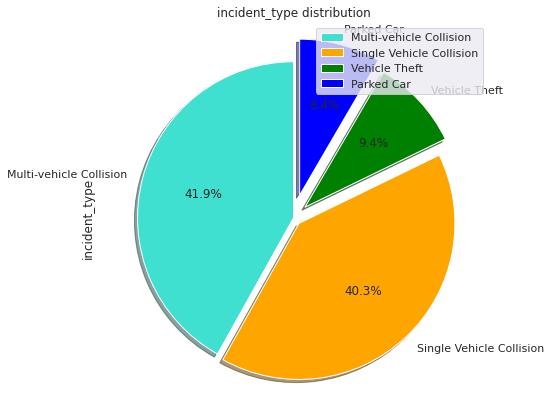

In [24]:
f, ax = plt.subplots(figsize=(15, 6))
order = list(Fraud['incident_type'].value_counts().index)

colors = ['turquoise','orange','green','blue']
explode = (0,0.05,0.1,0.15)
Fraud['incident_type'].value_counts().plot.pie(explode=explode , colors = colors ,startangle=90 ,autopct='%.1f%%',shadow=True, ax=ax)
ax.set_title('incident_type distribution');
ax.legend(loc = "upper right") 
plt.tight_layout() 
plt.show()

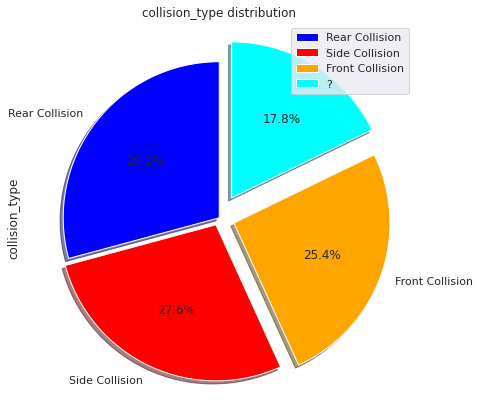

In [25]:
f, ax = plt.subplots(figsize=(15, 6))
order = list(Fraud['collision_type'].value_counts().index)

colors = ['blue','red','orange','cyan']
explode = (0,0.05,0.1,0.15)
Fraud['collision_type'].value_counts().plot.pie(explode=explode , colors = colors ,startangle=90 ,autopct='%.1f%%',shadow=True, ax=ax)
ax.set_title('collision_type distribution');
ax.legend(loc = "upper right") 
plt.tight_layout() 
plt.show()

In [26]:
Fraud['collision_type'].replace('?', 'Unknown', inplace = True)

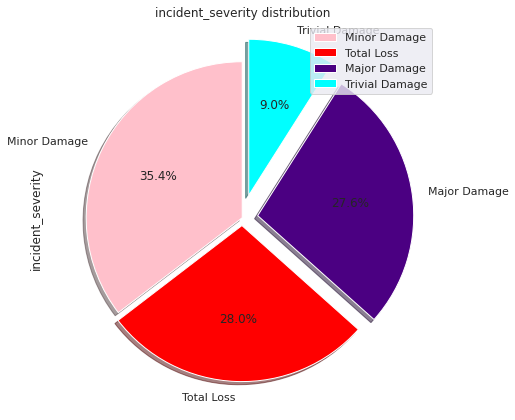

In [27]:
f, ax = plt.subplots(figsize=(15, 6))
order = list(Fraud['incident_severity'].value_counts().index)

colors = ['pink','red','indigo','cyan']
explode = (0,0.05,0.1,0.15)
Fraud['incident_severity'].value_counts().plot.pie(explode=explode , colors = colors ,startangle=90 ,autopct='%.1f%%',shadow=True, ax=ax)
ax.set_title('incident_severity distribution');
ax.legend(loc = "upper right") 
plt.tight_layout() 
plt.show()

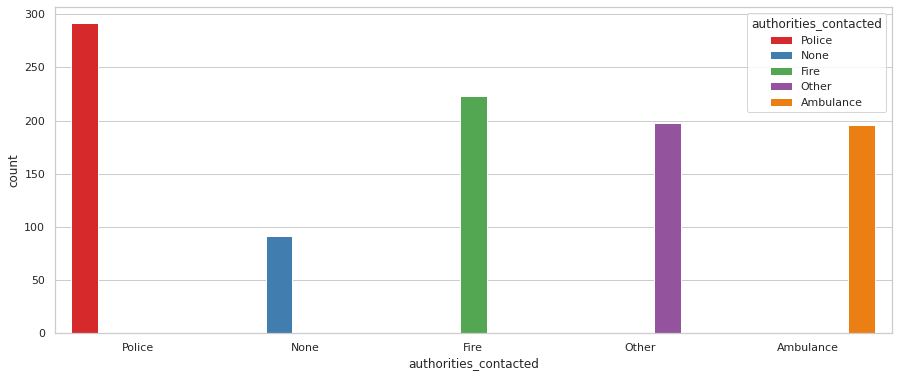

In [28]:
# Plotting authorities_contacted Distribution
sns.set_theme(style="whitegrid")
plt.figure(figsize=(15,6))
sns.countplot(x='authorities_contacted',data=Fraud,hue='authorities_contacted',saturation=.85,palette='Set1')
plt.show()

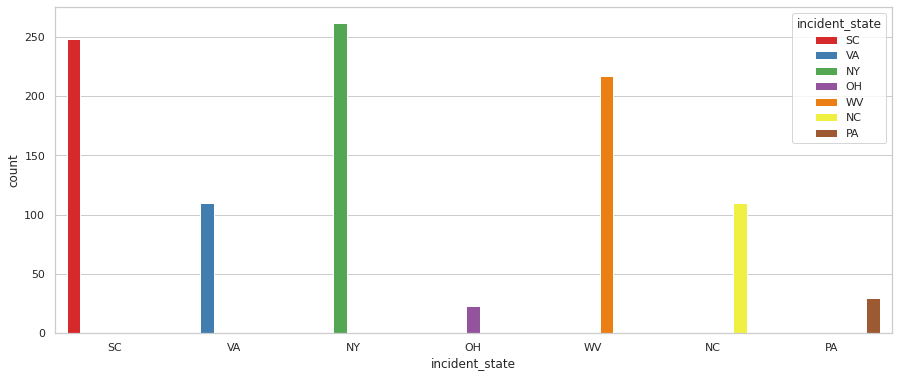

In [29]:
# Plotting incident_state Distribution
sns.set_theme(style="whitegrid")
plt.figure(figsize=(15,6))
sns.countplot(x='incident_state',data=Fraud,hue='incident_state',saturation=.85,palette='Set1')
plt.show()

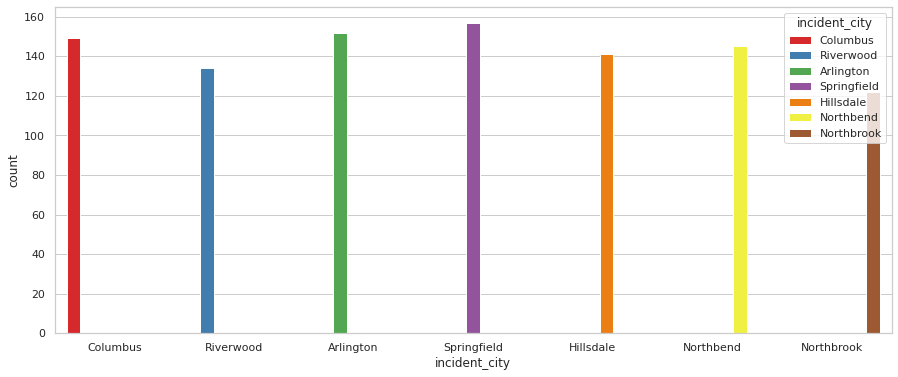

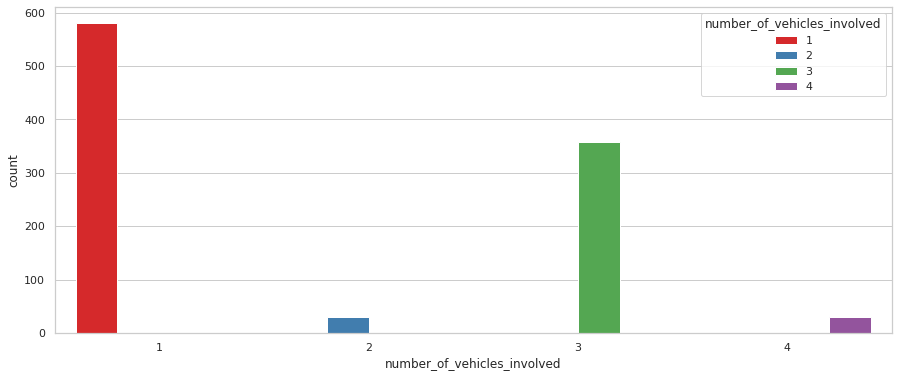

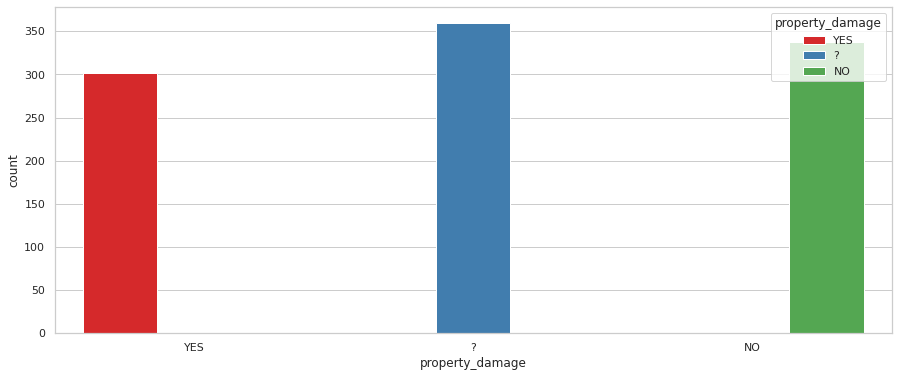

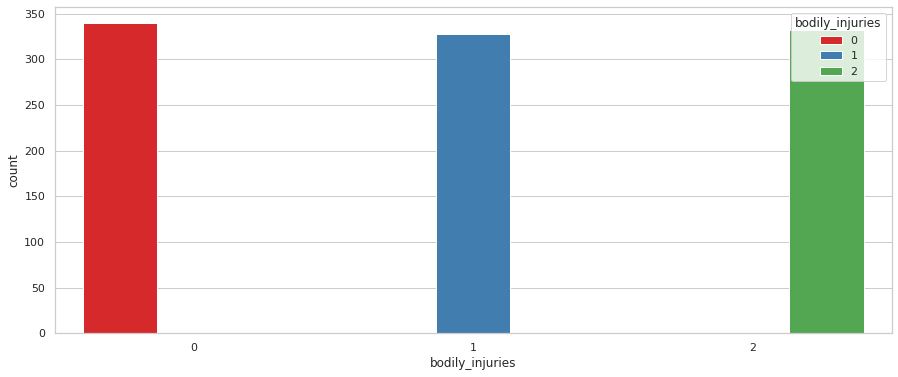

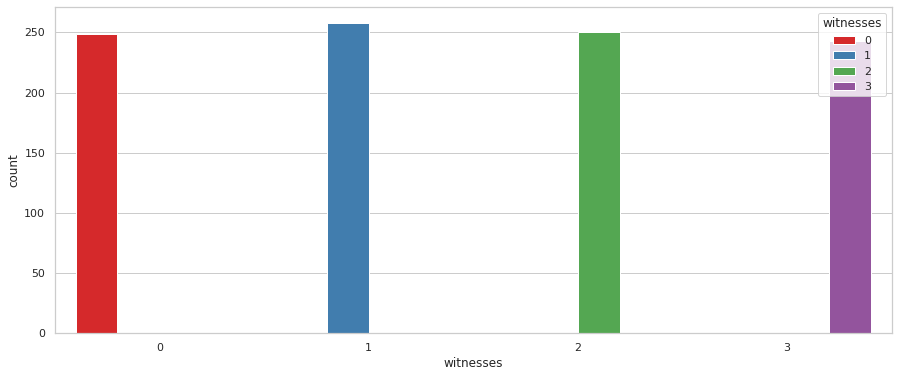

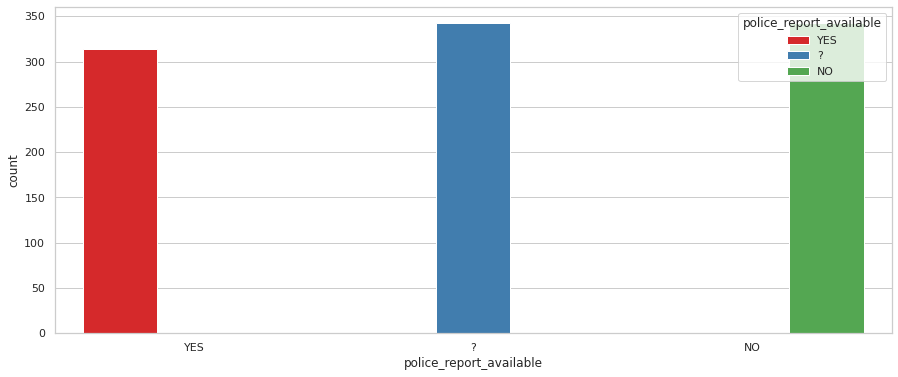

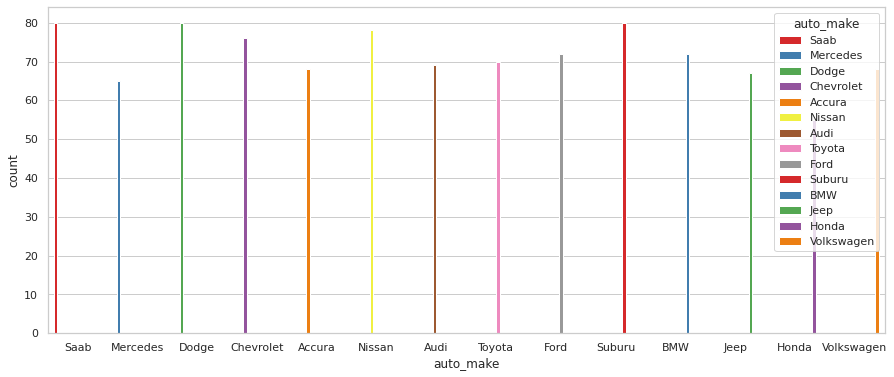

In [30]:
Z = ['incident_city','number_of_vehicles_involved','property_damage','bodily_injuries','witnesses','police_report_available','auto_make']
for i in Z:
  plt.figure(figsize=(15,6))
  sns.countplot(x=i,data=Fraud,hue=i,saturation=.85,palette='Set1')
  plt.show()


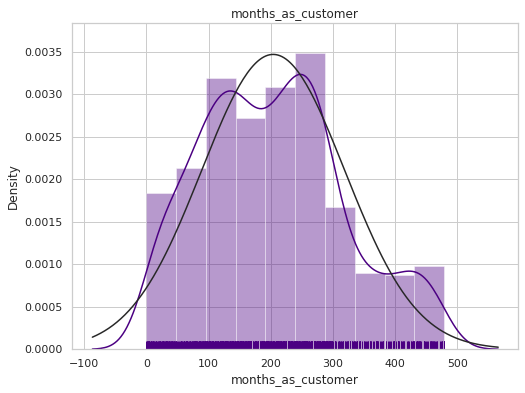

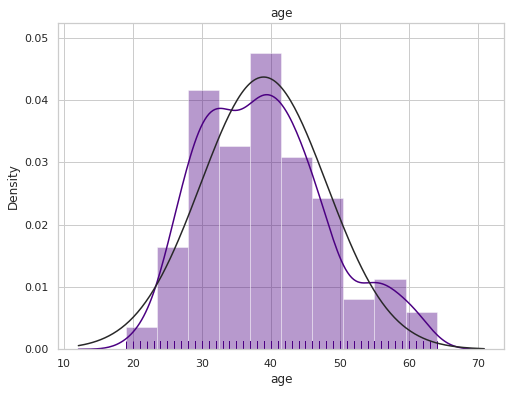

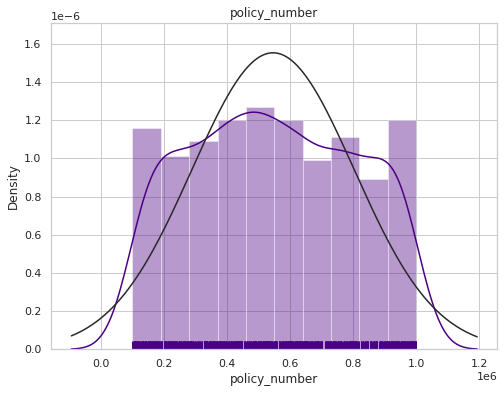

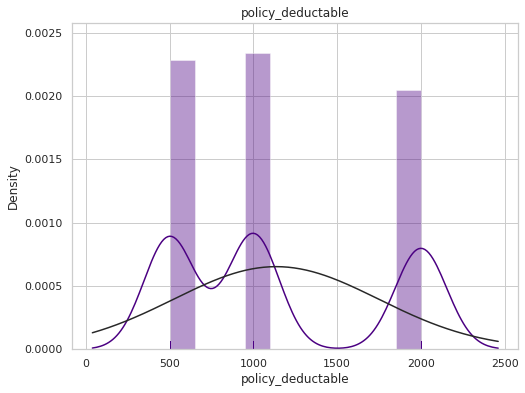

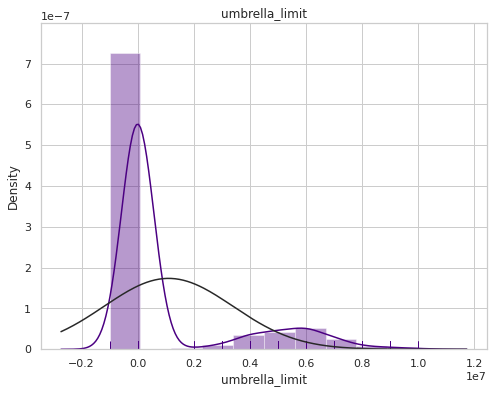

...

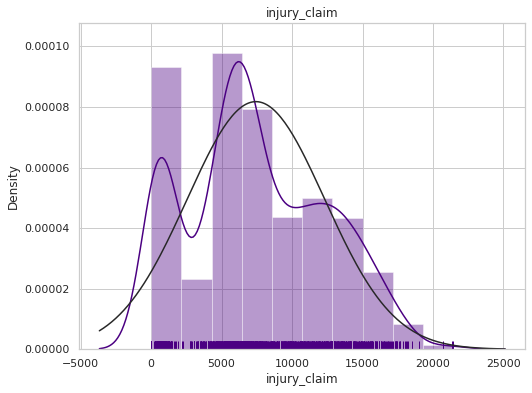

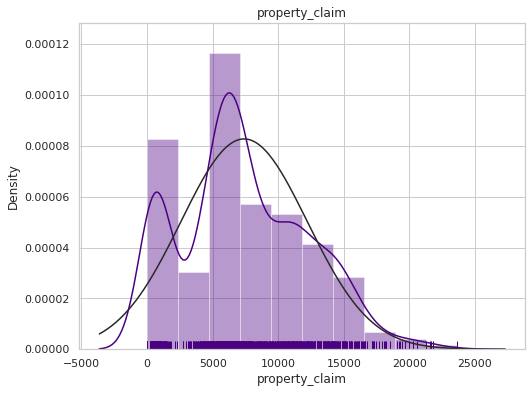

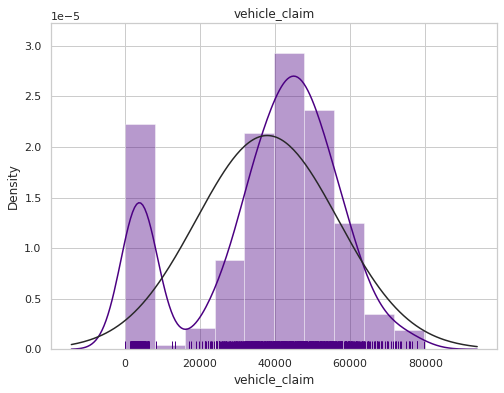

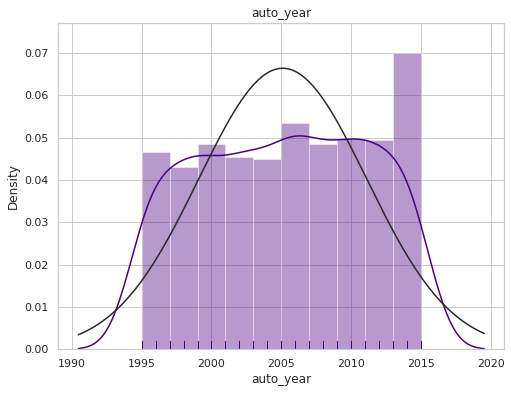

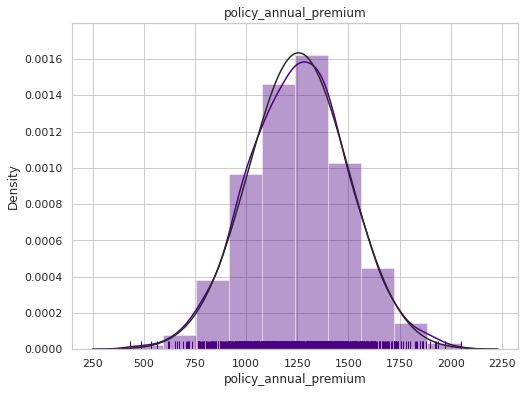

In [31]:
#Plotting Distplot for continous values

from scipy.stats import norm
for i in continous_cols:
  plt.figure(figsize = (8,6))
  sns.distplot(Fraud[i], bins = 10, rug=True,color='indigo',fit=norm)
  plt.title(i)
  plt.show()

**A lot of the graphs are almost perfectly bell shaped like policy_annual_premium, vehicle_claim, total_claim_amount, etc.**

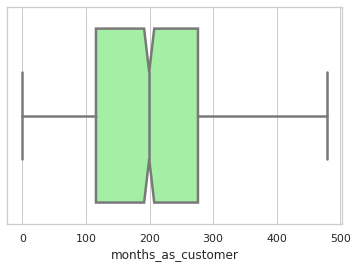

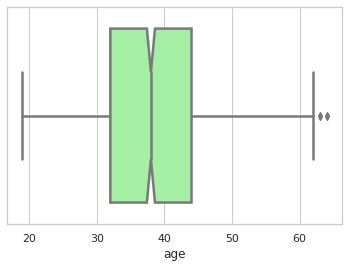

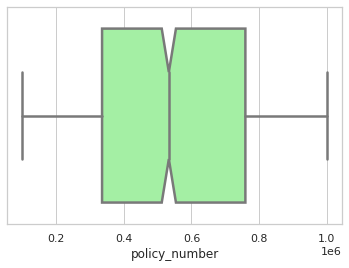

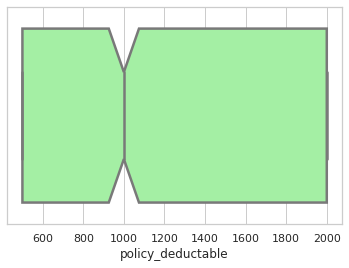

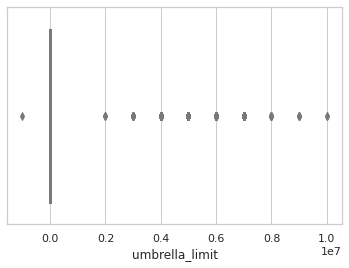

...

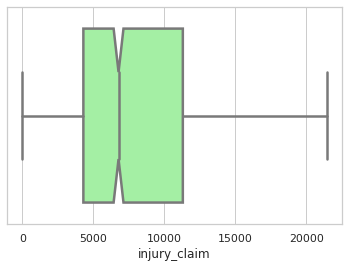

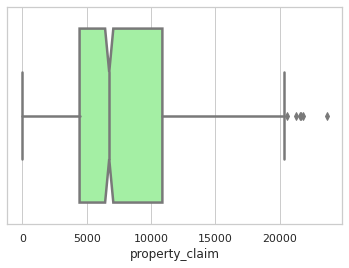

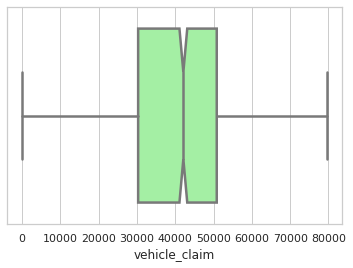

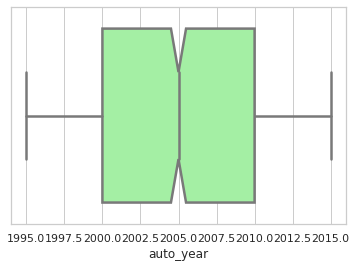

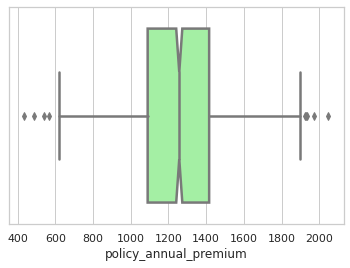

In [32]:
for i in continous_cols:
  sns.boxplot(Fraud[i], notch=True,color='palegreen',linewidth=2.5)
  plt.show()

**Observation :**

There are some outliers present in age, umbrella_limit , property_claim ,policy_annual_premium 

**Dropping 'policy_bind_date', 'incident_date', 'incident_location' because they didn't give us much information about.**

In [6]:
Fraud.drop(['policy_bind_date', 'incident_date', 'incident_location'], axis = 1, inplace = True)
Fraud.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,328,48,521585,OH,250/500,1000,1406.91,0,466132,MALE,MD,craft-repair,sleeping,husband,53300,0,Single Vehicle Collision,Side Collision,Major Damage,Police,SC,Columbus,5,1,YES,1,2,YES,71610,6510,13020,52080,Saab,92x,2004,Y
1,228,42,342868,IN,250/500,2000,1197.22,5000000,468176,MALE,MD,machine-op-inspct,reading,other-relative,0,0,Vehicle Theft,?,Minor Damage,Police,VA,Riverwood,8,1,?,0,0,?,5070,780,780,3510,Mercedes,E400,2007,Y
2,134,29,687698,OH,100/300,2000,1413.14,5000000,430632,FEMALE,PhD,sales,board-games,own-child,35100,0,Multi-vehicle Collision,Rear Collision,Minor Damage,Police,NY,Columbus,7,3,NO,2,3,NO,34650,7700,3850,23100,Dodge,RAM,2007,N
3,256,41,227811,IL,250/500,2000,1415.74,6000000,608117,FEMALE,PhD,armed-forces,board-games,unmarried,48900,-62400,Single Vehicle Collision,Front Collision,Major Damage,Police,OH,Arlington,5,1,?,1,2,NO,63400,6340,6340,50720,Chevrolet,Tahoe,2014,Y
4,228,44,367455,IL,500/1000,1000,1583.91,6000000,610706,MALE,Associate,sales,board-games,unmarried,66000,-46000,Vehicle Theft,?,Minor Damage,None,NY,Arlington,20,1,NO,0,1,NO,6500,1300,650,4550,Accura,RSX,2009,N


In [7]:
category_cols.remove('policy_bind_date')
category_cols.remove('incident_date')
category_cols.remove('incident_location')

**We can see some columns have '?' as value, we won't treat these values instead we are going to replace it with 'Unknown'.**

In [8]:
Fraud['collision_type'].replace('?', 'Unknown', inplace = True)
Fraud['property_damage'].replace('?', 'Unknown', inplace = True)
Fraud['police_report_available'].replace('?', 'Unknown', inplace = True)

**Bivariant_Analysis**

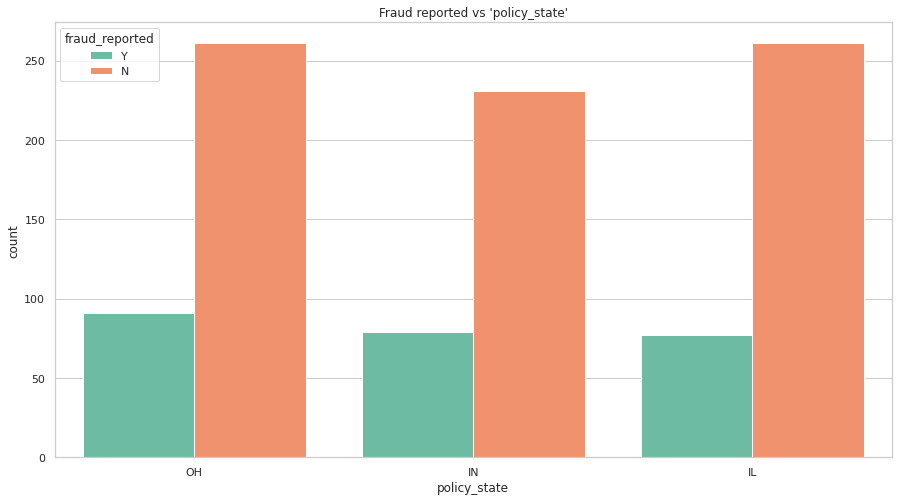

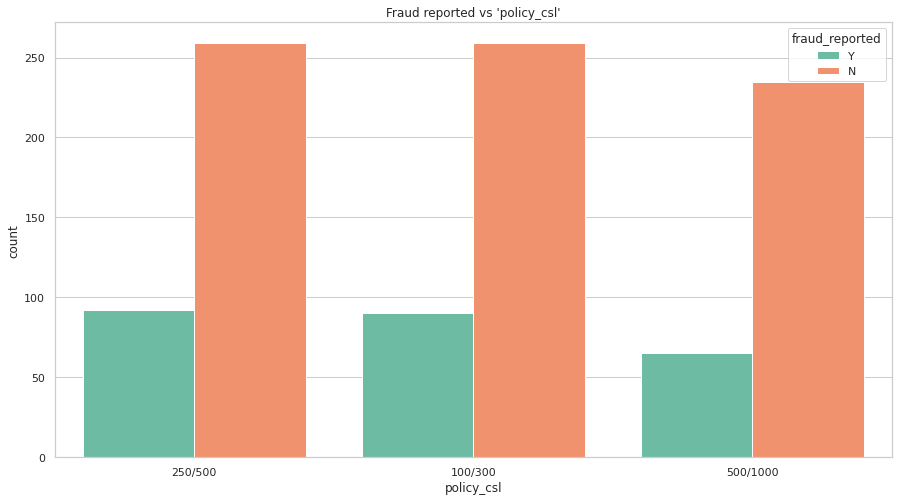

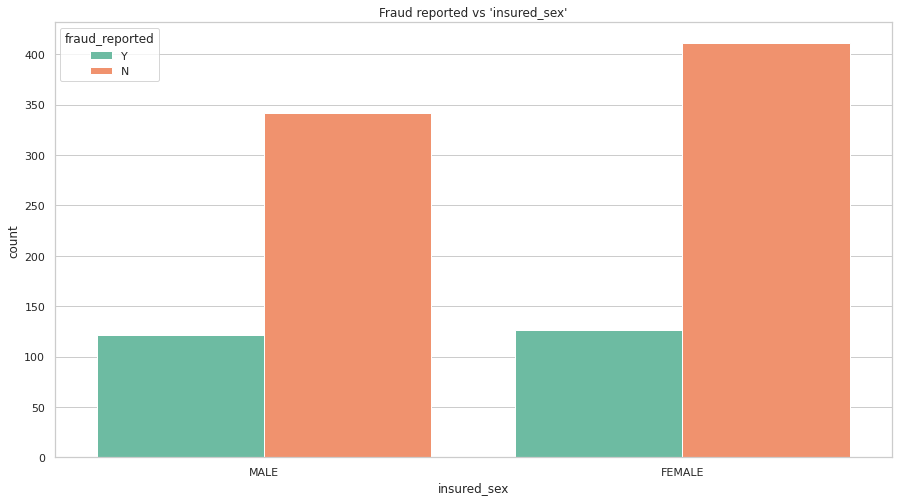

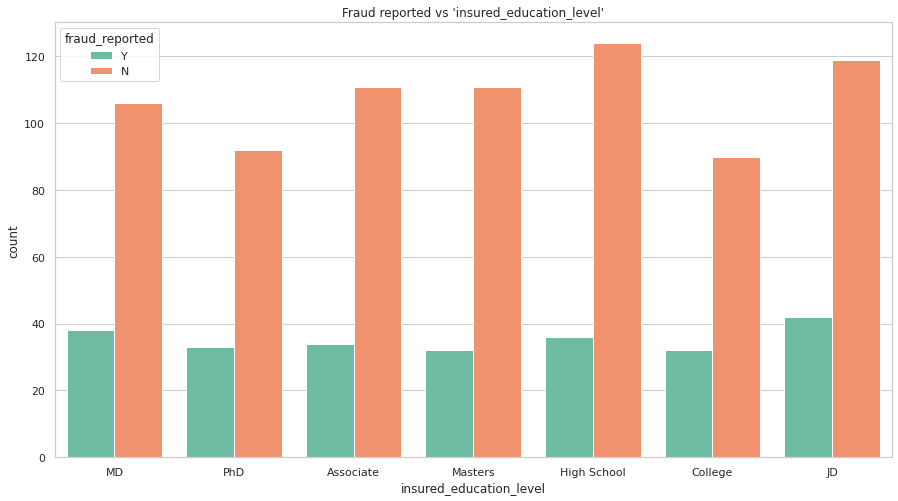

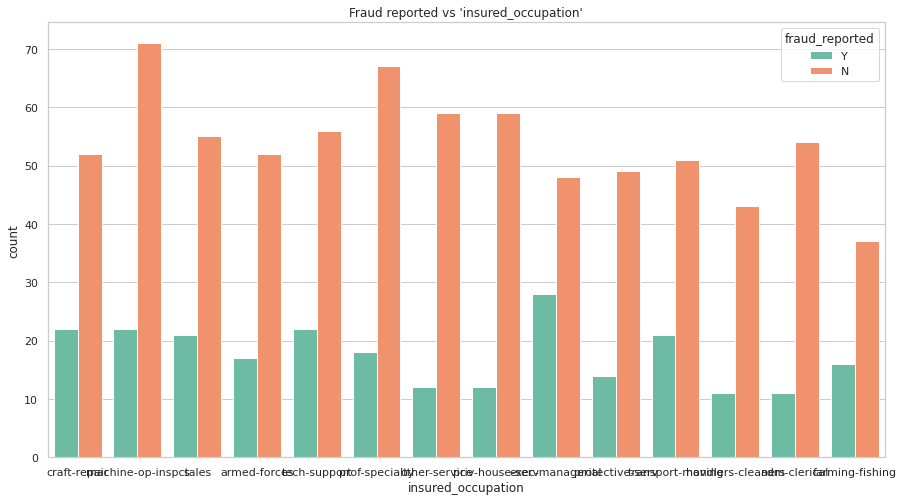

...

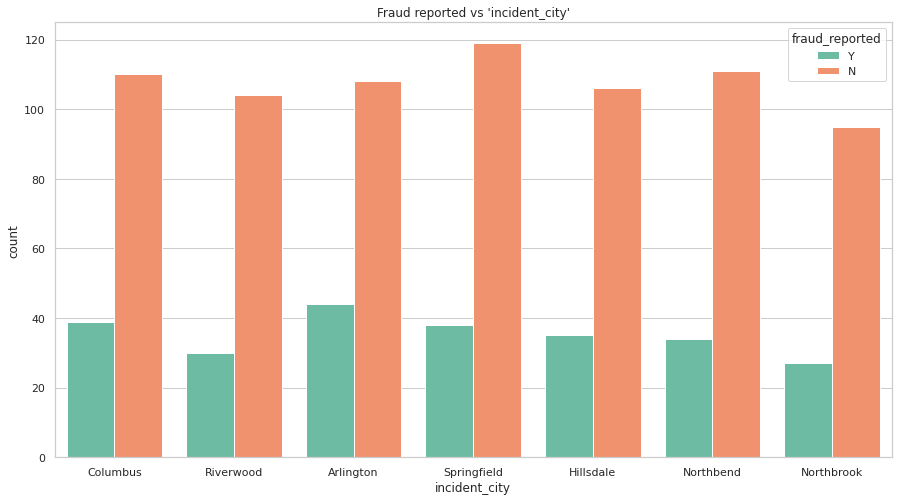

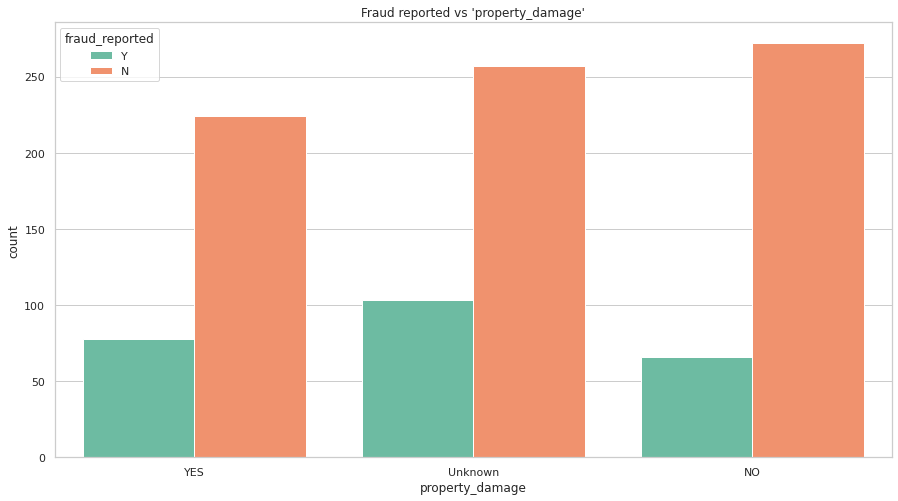

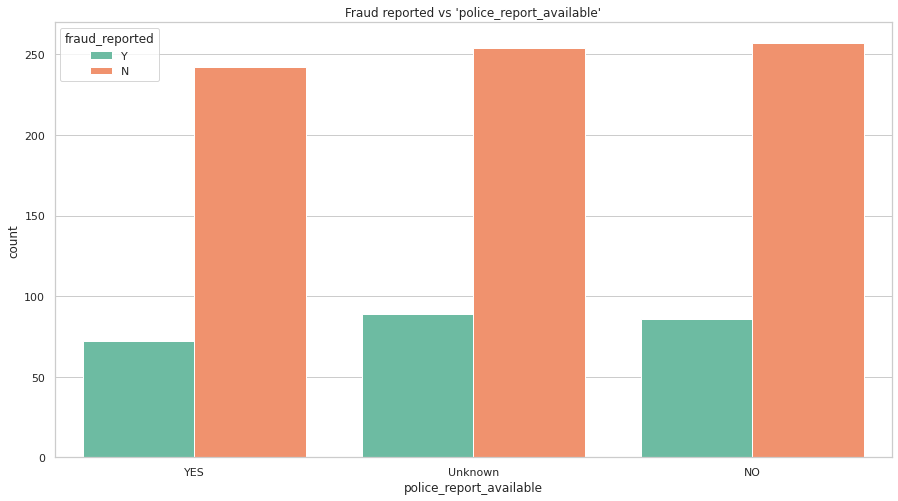

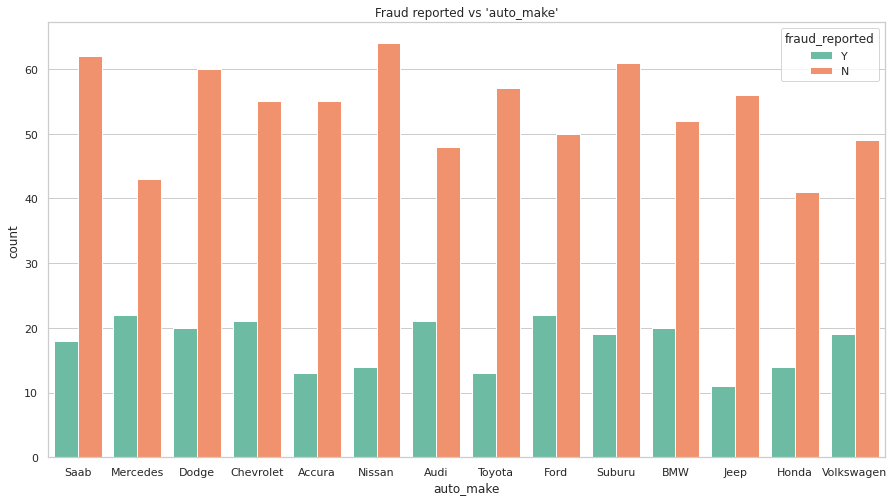

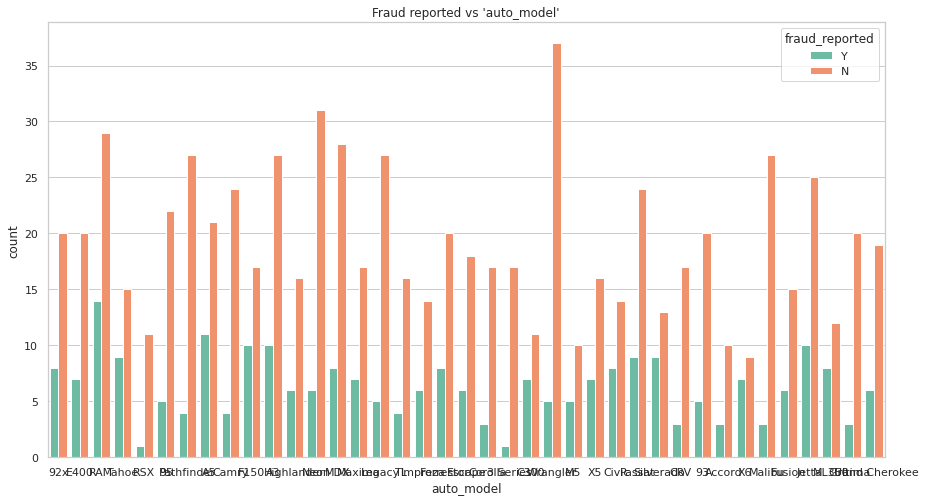

In [38]:
for i in category_cols[:-1]:                                
    plt.figure(figsize=(15, 8))
    plt.title("Fraud reported vs '%s'"%i)
    sns.countplot(Fraud[i],hue=Fraud['fraud_reported'],saturation=.85,palette='Set2')

**In Incident severity we can see that fraud is reported in a lot of major damage cases. Apart from that it shows that other columns and bars have low fraud reported rate.**

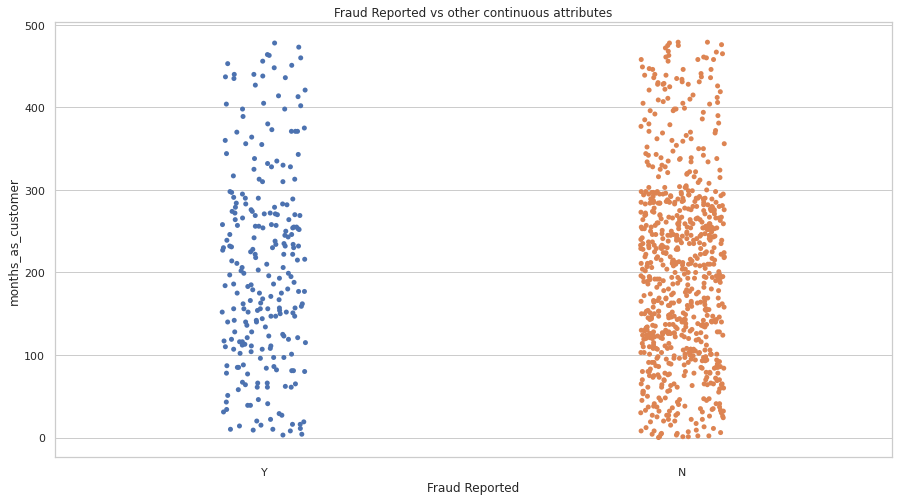

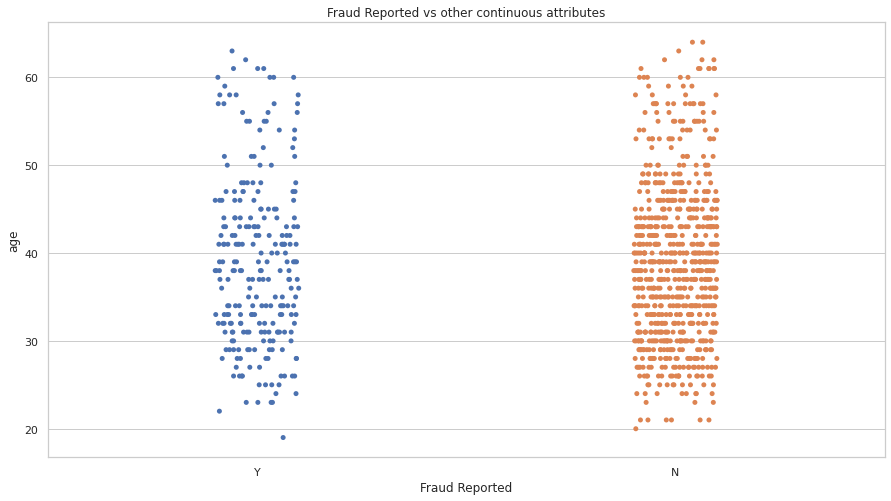

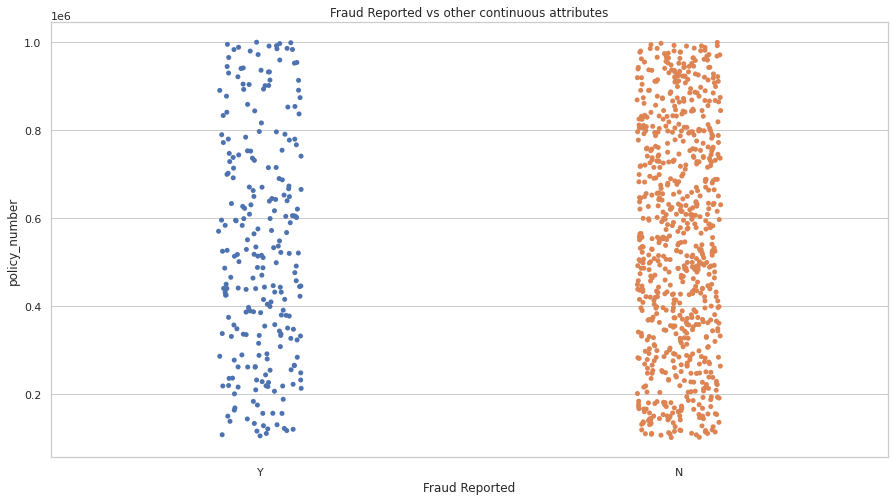

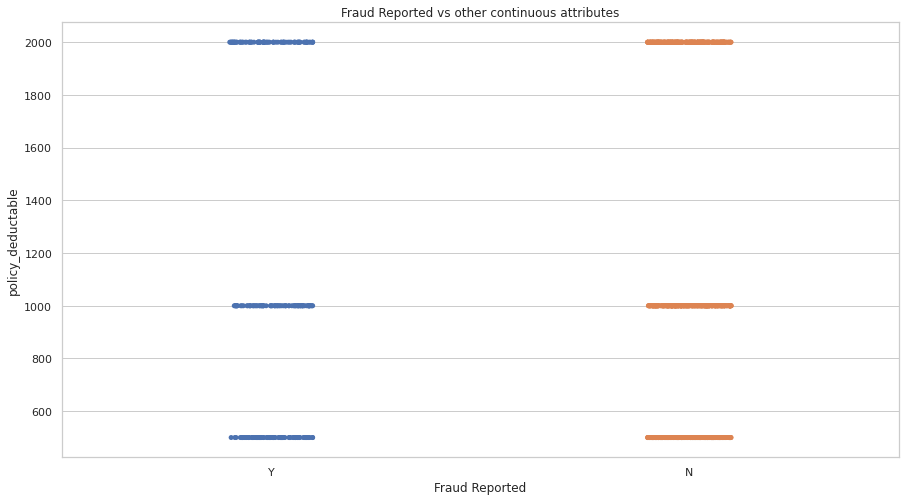

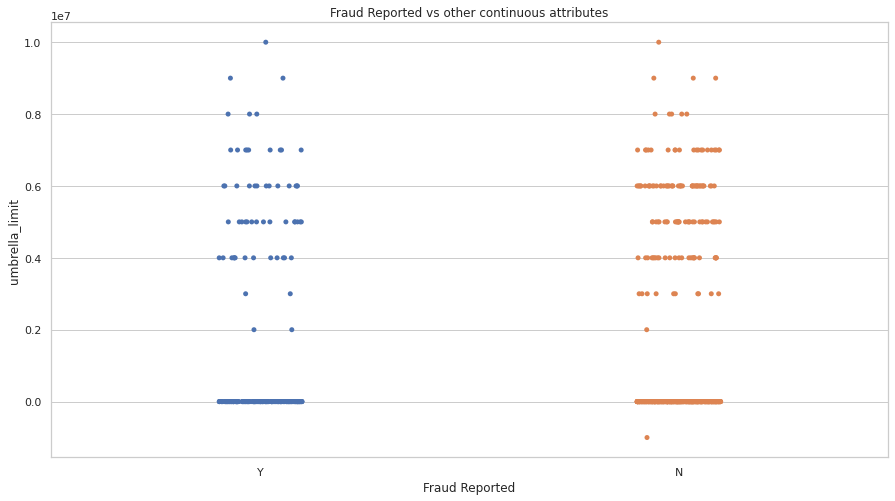

...

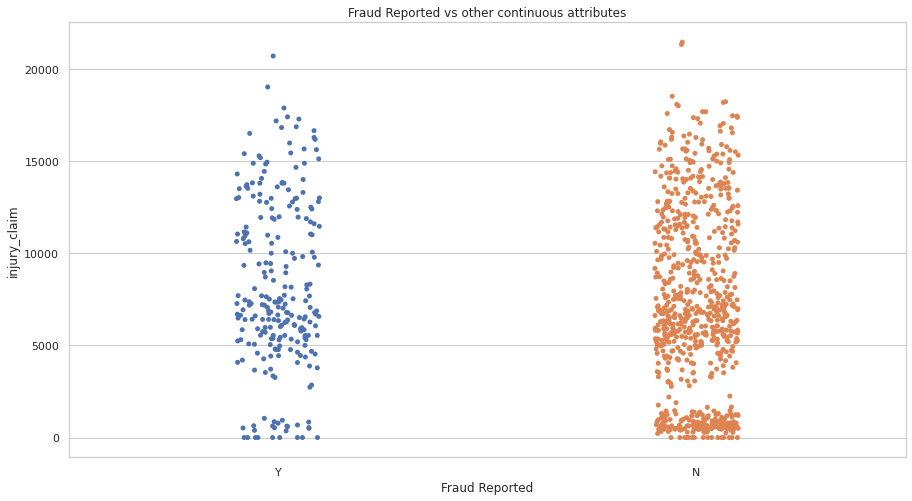

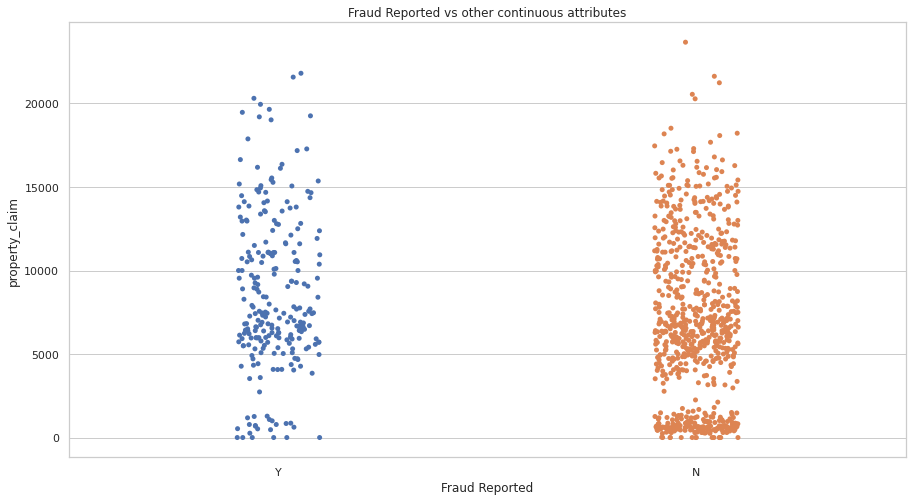

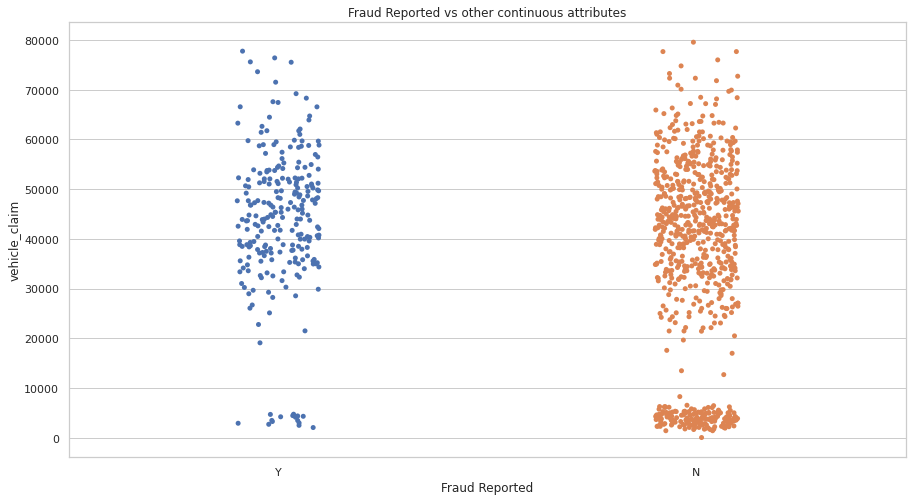

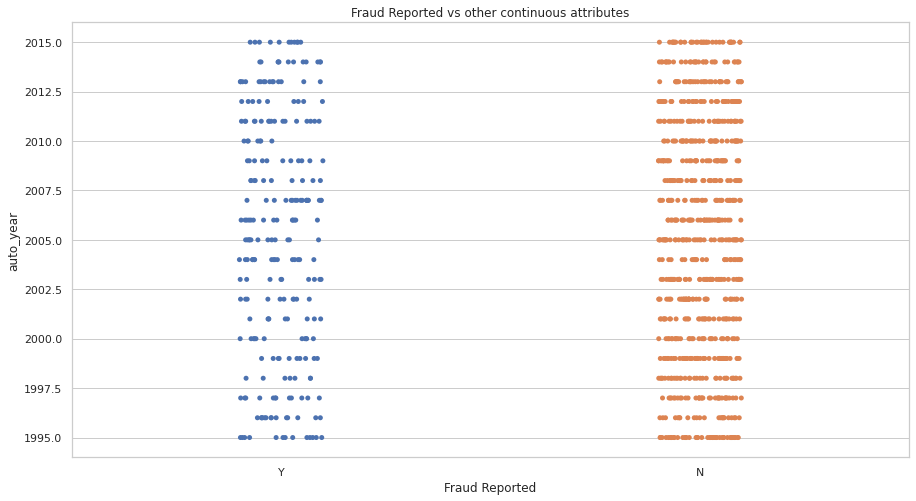

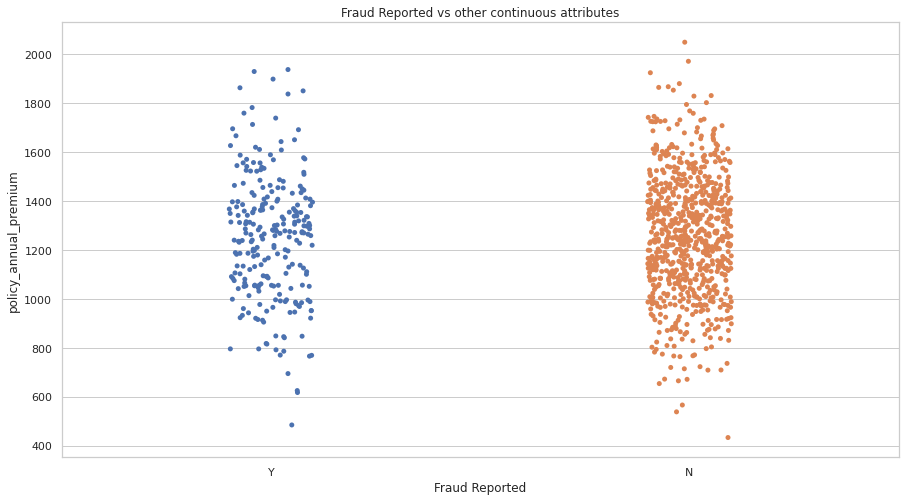

In [43]:
for i in continous_cols:                                          
    plt.figure(figsize = (15, 8))
    ax = sns.stripplot(Fraud['fraud_reported'], Fraud[i])
    ax.set(xlabel = 'Fraud Reported', ylabel = i)
    plt.title('Fraud Reported vs other continuous attributes')
    plt.show()

**Above plotting shows that it is a good complement to a boxplot or violinplot in cases where all observations are shown along with some representation of the underlying distribution.**

**Performing Label_Encoder**

In [9]:
from sklearn.preprocessing import LabelEncoder

for i in Fraud:
  label_encoder = LabelEncoder()
  Fraud[i] = label_encoder.fit_transform(Fraud[i])

In [10]:
Fraud.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
0,299,29,480,2,1,1,732,1,486,1,4,2,17,0,187,353,2,2,0,4,4,1,5,0,2,1,2,2,563,258,512,545,10,1,9,1
1,212,23,257,1,1,2,396,5,519,1,4,6,15,2,0,353,3,3,1,4,5,5,8,0,1,0,0,1,44,46,45,38,8,12,12,1
2,123,10,672,2,0,2,740,5,6,0,6,11,2,3,63,353,0,1,1,4,1,1,7,2,0,2,3,0,143,337,104,116,4,30,12,0
3,239,22,140,0,1,2,743,6,812,0,6,1,2,4,153,98,2,0,0,4,2,0,5,0,1,1,2,0,451,245,249,521,3,34,19,1
4,212,25,286,0,2,1,902,6,850,1,0,11,2,4,265,211,3,3,1,2,1,0,20,0,0,0,1,0,81,70,36,66,0,31,14,0


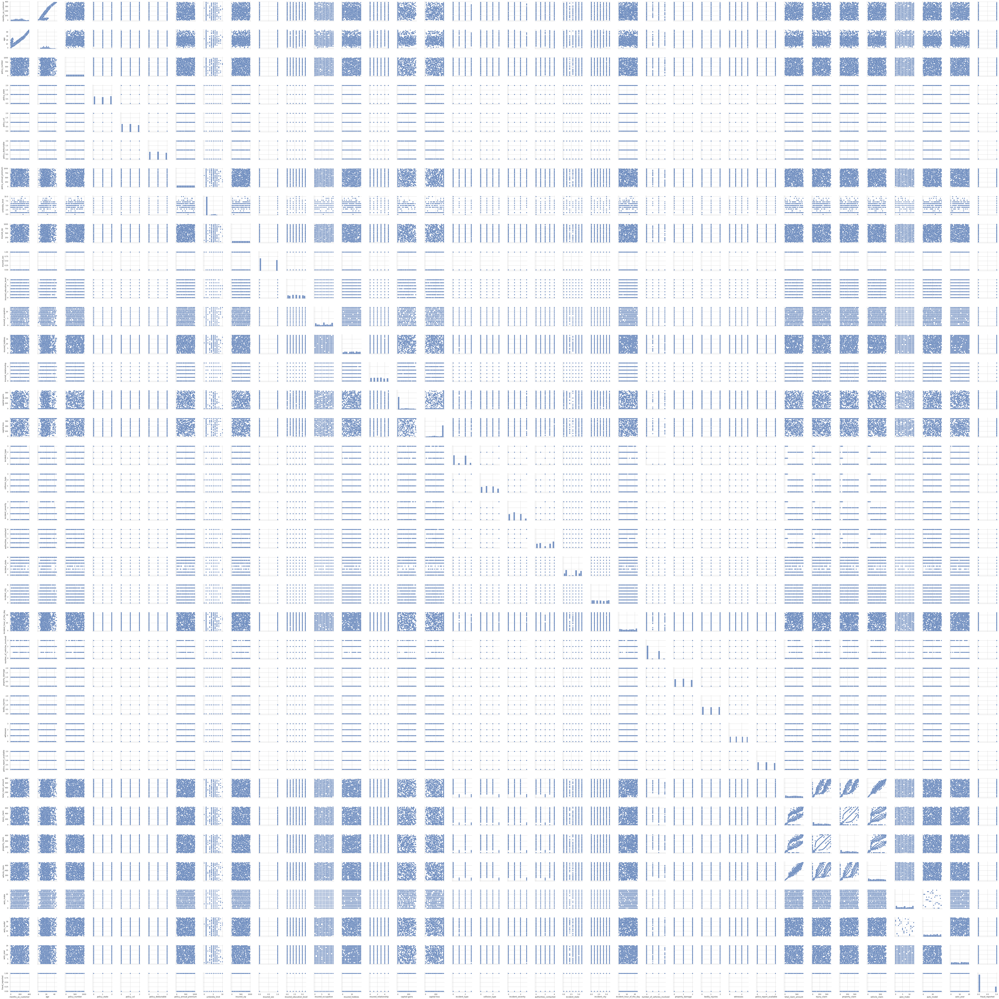

In [46]:
#Ploting Pairplot
sns.pairplot(Fraud)

In [58]:
#Checking correlation between variables
cor = Fraud.corr()
cor

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year,fraud_reported
months_as_customer,1.000000,0.911296,0.059023,-0.000783,-0.026295,0.016873,0.014294,0.017145,0.015904,0.059153,0.000265,0.010330,-0.096075,0.067755,-0.002832,0.015991,-0.014053,-0.077324,-0.052274,0.004792,0.004622,0.004008,0.072231,0.014040,-0.001100,-0.012533,0.057284,-0.054833,0.055934,0.064041,0.029788,0.052742,0.044443,0.001095,0.002020,0.017095
age,0.911296,1.000000,0.061380,-0.014533,-0.015185,0.020561,0.017822,0.021924,0.013517,0.073337,0.000969,0.017220,-0.081315,0.074832,-0.012514,0.006513,-0.025626,-0.086068,-0.058439,0.015417,0.005770,-0.002291,0.087161,0.022102,-0.004365,-0.015679,0.052359,-0.049797,0.071265,0.075124,0.060450,0.059784,0.030410,0.017343,0.001354,0.012143
policy_number,0.059023,0.061380,1.000000,0.073149,0.038834,-0.015075,0.018033,0.013341,-0.000690,0.003588,-0.038415,-0.012951,0.039250,0.017498,0.002104,-0.010384,0.001314,0.008076,-0.016262,0.019457,-0.011261,-0.035541,-0.001261,0.013945,-0.038842,-0.005067,-0.013730,0.023258,-0.009532,-0.012413,-0.003358,-0.014299,0.024663,0.064259,0.000465,-0.030222
policy_state,-0.000783,-0.014533,0.073149,1.000000,0.001027,0.008213,0.014751,-0.031793,0.025074,-0.020481,-0.034327,-0.031215,-0.038689,-0.018506,0.074460,-0.027070,0.031848,0.037564,-0.026377,-0.016777,0.008723,-0.002077,0.029457,-0.042263,-0.023346,0.013384,0.022960,0.046682,-0.015990,-0.042685,0.009282,-0.007492,0.017124,-0.025253,0.002114,0.029432
policy_csl,-0.026295,-0.015185,0.038834,0.001027,1.000000,0.001986,0.017161,0.022779,0.006474,-0.010757,0.009153,0.015788,-0.005960,-0.030063,0.002968,-0.035136,0.011997,0.065861,0.022530,0.056182,0.032814,0.009333,-0.001869,-0.019403,-0.019862,-0.000595,0.071500,-0.005252,-0.043541,-0.076419,-0.041428,-0.027320,-0.004701,0.047885,-0.033082,-0.037190
policy_deductable,0.016873,0.020561,-0.015075,0.008213,0.001986,1.000000,0.003182,0.009402,-0.004227,-0.011948,0.012000,-0.053245,-0.006006,-0.025468,0.022064,-0.013690,-0.036759,-0.035281,-0.010001,-0.009862,0.010650,-0.038425,0.066442,0.043148,0.007369,-0.020129,0.074994,0.038323,0.020877,0.028482,0.058976,0.004261,-0.030775,-0.003892,0.024921,0.007620
policy_annual_premium,0.014294,0.017822,0.018033,0.014751,0.017161,0.003182,1.000000,-0.003712,0.043082,0.034839,-0.016601,0.028204,-0.023982,0.006295,-0.004442,0.042620,0.047205,0.021936,-0.014801,-0.049962,0.033840,0.059491,-0.002900,-0.043527,0.042703,0.020450,0.012004,0.012730,-0.001025,-0.021839,-0.006593,0.009413,0.007216,-0.030185,-0.031015,-0.015261
umbrella_limit,0.017145,0.021924,0.013341,-0.031793,0.022779,0.009402,-0.003712,1.000000,0.010062,0.009733,-0.019668,0.024072,-0.037534,0.073487,-0.049076,-0.021814,0.013614,0.040220,0.011335,0.029204,-0.078174,0.013945,-0.024305,-0.019524,-0.072219,0.016680,-0.005779,-0.017330,-0.036495,-0.048003,-0.018668,-0.031991,-0.007169,0.042421,0.010528,0.057719
insured_zip,0.015904,0.013517,-0.000690,0.025074,0.006474,-0.004227,0.043082,0.010062,1.000000,-0.034313,0.010645,-0.071785,0.018891,-0.006365,0.000722,0.031819,0.002322,0.013556,-0.050411,-0.048834,-0.021164,-0.005438,0.010707,0.014780,-0.015825,0.040152,0.022141,0.024371,-0.005345,-0.005417,-0.014892,-0.017019,-0.028966,0.029470,-0.027803,0.061767
insured_sex,0.059153,0.073337,0.003588,-0.020481,-0.010757,-0.011948,0.034839,0.009733,-0.034313,1.000000,0.009002,-0.006160,-0.020317,0.002855,-0.019581,-0.007104,0.009952,0.003799,-0.028168,0.017914,-0.022379,0.014470,0.019290,0.018793,0.016733,-

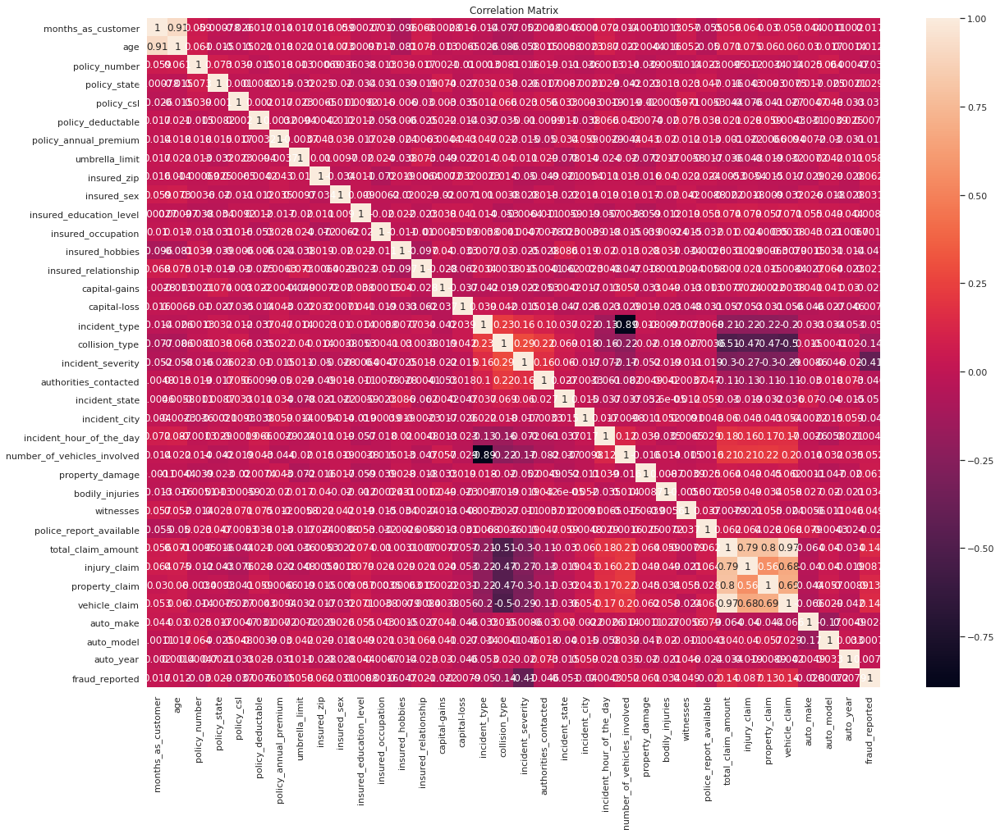

In [59]:
plt.figure(figsize = [20, 15])                             #multivariate analysis
sns.heatmap(cor, annot = True)
plt.title('Correlation Matrix')
plt.show()

**From the above plot , information is not clear. Hence lets look for each attributes correlation with Target Variable .**

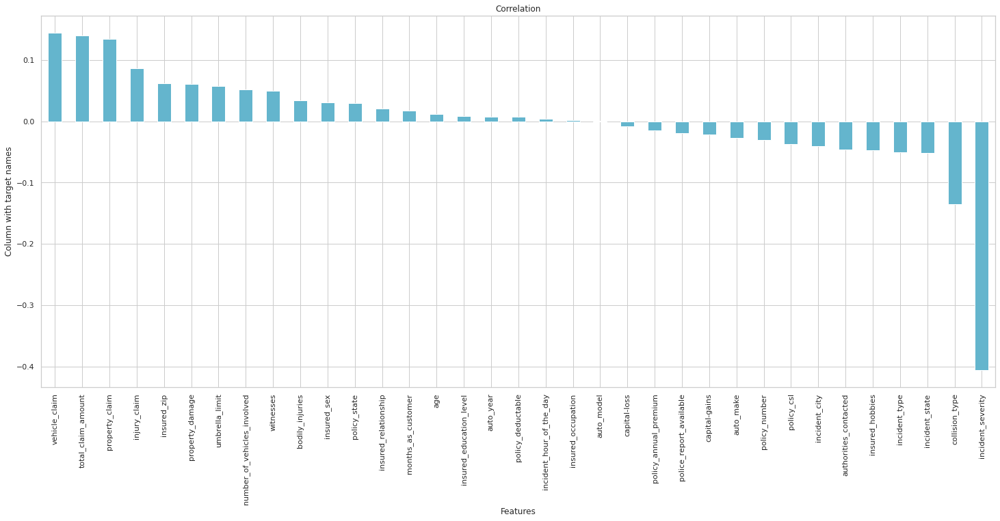

In [60]:
plt.figure(figsize = (25, 10))
Fraud.corr()['fraud_reported'].sort_values(ascending = False).drop(['fraud_reported']).plot(kind = 'bar', color = 'c')
plt.xlabel('Features')
plt.ylabel('Column with target names')
plt.title('Correlation')
plt.show()

**Observation :**

1. Right side of the plot shows all attributes with +ve correlation with Target while left side of the plot shows all columns with -ve correlation with Target.
2. Fraud reported is highly correlated with vehicle_claim then total_claim_amount and then property_claim with correlation of 0.17, 0.16, 0.14 respectively.

In [61]:
cor['fraud_reported'].sort_values(ascending=False)

fraud_reported                 1.000000
vehicle_claim                  0.144769
total_claim_amount             0.140553
property_claim                 0.133952
injury_claim                   0.086889
insured_zip                    0.061767
property_damage                0.060616
umbrella_limit                 0.057719
number_of_vehicles_involved    0.051839
witnesses                      0.049497
bodily_injuries                0.033877
insured_sex                    0.030873
policy_state                   0.029432
insured_relationship           0.021043
months_as_customer             0.017095
age                            0.012143
insured_education_level        0.008808
auto_year                      0.007928
policy_deductable              0.007620
incident_hour_of_the_day       0.004316
insured_occupation             0.001564
auto_model                     0.000720
capital-loss                  -0.007930
policy_annual_premium         -0.015261
police_report_available       -0.019571


# **Data Cleaning**

In [62]:
#Checking for Missing Values

Fraud.isnull().sum()


months_as_customer             0
age                            0
policy_number                  0
policy_state                   0
policy_csl                     0
policy_deductable              0
policy_annual_premium          0
umbrella_limit                 0
insured_zip                    0
insured_sex                    0
insured_education_level        0
insured_occupation             0
insured_hobbies                0
insured_relationship           0
capital-gains                  0
capital-loss                   0
incident_type                  0
collision_type                 0
incident_severity              0
authorities_contacted          0
incident_state                 0
incident_city                  0
incident_hour_of_the_day       0
number_of_vehicles_involved    0
property_damage                0
bodily_injuries                0
witnesses                      0
police_report_available        0
total_claim_amount             0
injury_claim                   0
property_c

**No Null values Present**

 **2. Checking for outliers**

months_as_customer                 AxesSubplot(0.125,0.71587;0.065678x0.16413)
age                             AxesSubplot(0.203814,0.71587;0.065678x0.16413)
policy_number                   AxesSubplot(0.282627,0.71587;0.065678x0.16413)
policy_state                    AxesSubplot(0.361441,0.71587;0.065678x0.16413)
policy_csl                      AxesSubplot(0.440254,0.71587;0.065678x0.16413)
policy_deductable               AxesSubplot(0.519068,0.71587;0.065678x0.16413)
policy_annual_premium           AxesSubplot(0.597881,0.71587;0.065678x0.16413)
umbrella_limit                  AxesSubplot(0.676695,0.71587;0.065678x0.16413)
insured_zip                     AxesSubplot(0.755508,0.71587;0.065678x0.16413)
insured_sex                     AxesSubplot(0.834322,0.71587;0.065678x0.16413)
insured_education_level           AxesSubplot(0.125,0.518913;0.065678x0.16413)
insured_occupation             AxesSubplot(0.203814,0.518913;0.065678x0.16413)
insured_hobbies                AxesSubplot(0.282627,

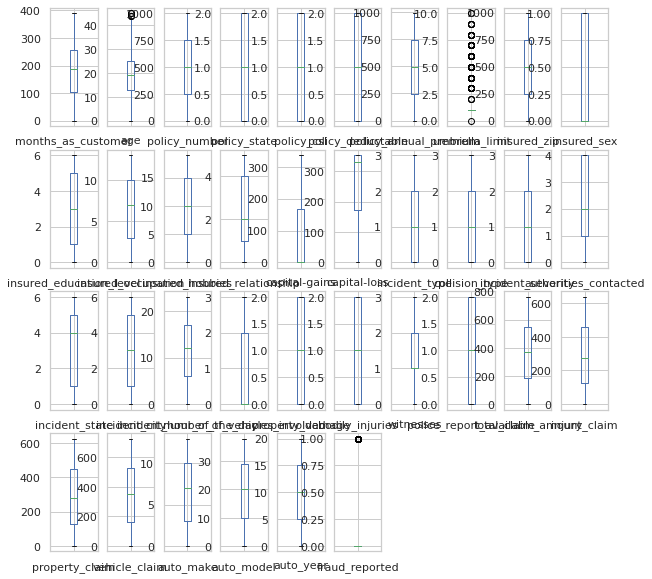

In [63]:
#Plotting Outliers
Fraud.plot(kind='box',subplots= True,layout=(4,10),figsize=(10,10))

**Removing Outliers**

In [12]:
#Removing Outliers using Zscore

from scipy.stats import zscore

z=np.abs(zscore(Fraud))
new_Fraud = Fraud[(z<3).all(axis=1)]

In [13]:
new_Fraud.shape , Fraud.shape

((985, 36), (1000, 36))

In [67]:
# % of outliers

((1000-985)/1000)*100

1.5

**There would be a loss of 1.5% data , which is very much affordable . Hence lets continue with new_Fraud .**

**3. Checking for Skewness**


In [14]:
new_Fraud.skew()

months_as_customer             0.096656
age                            0.480506
policy_number                  0.004961
policy_state                  -0.036054
policy_csl                     0.093953
policy_deductable              0.060667
policy_annual_premium         -0.001693
umbrella_limit                 1.902038
insured_zip                    0.005475
insured_sex                    0.144759
insured_education_level        0.004685
insured_occupation            -0.052412
insured_hobbies               -0.061536
insured_relationship           0.077333
capital-gains                  0.880109
capital-loss                  -0.807319
incident_type                  0.091063
collision_type                 0.129600
incident_severity              0.281858
authorities_contacted         -0.113349
incident_state                -0.151360
incident_city                  0.045660
incident_hour_of_the_day      -0.034538
number_of_vehicles_involved    0.509302
property_damage                0.060224


**There is skewness present in some of the columns . Lets remove it using PowerTransformer**

In [15]:
#Using PowerTransformer to remove skewness

from sklearn.preprocessing import PowerTransformer

pt=PowerTransformer(method='yeo-johnson') ##using yeo-johnson method due to presence of negative skewness
for i in new_Fraud.skew().index[1:]:
    if new_Fraud.skew().loc[i]>0.55:
        new_Fraud[i]=pt.fit_transform(new_Fraud[i].values.reshape(-1,1))
    if new_Fraud.skew().loc[i]<-0.55:
        new_Fraud[i]=pt.fit_transform(new_Fraud[i].values.reshape(-1,1))
    else:
        new_Fraud[i]=new_Fraud[i]

# **Split Data and Target**

In [23]:
#Preparing the Data
#Setting X and y-axis .
#Since we want to predict the fraud, we will drop the ‘fraud_reported’ column.
from sklearn.model_selection import train_test_split

X = new_Fraud.drop(['fraud_reported'],axis=1)
y = new_Fraud['fraud_reported']

In [24]:
X.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,299,29,480,2,1,1,732,1,486,1,4,2,17,0,187,353,2,2,0,4,4,1,5,0,2,1,2,2,563,258,512,545,10,1,9
1,212,23,257,1,1,2,396,5,519,1,4,6,15,2,0,353,3,3,1,4,5,5,8,0,1,0,0,1,44,46,45,38,8,12,12
2,123,10,672,2,0,2,740,5,6,0,6,11,2,3,63,353,0,1,1,4,1,1,7,2,0,2,3,0,143,337,104,116,4,30,12
3,239,22,140,0,1,2,743,6,812,0,6,1,2,4,153,98,2,0,0,4,2,0,5,0,1,1,2,0,451,245,249,521,3,34,19
4,212,25,286,0,2,1,902,6,850,1,0,11,2,4,265,211,3,3,1,2,1,0,20,0,0,0,1,0,81,70,36,66,0,31,14


In [25]:
y

0      1
1      1
2      0
3      1
4      0
      ..
995    0
996    0
997    0
998    0
999    0
Name: fraud_reported, Length: 985, dtype: int64

**Scalling of Data**

In [26]:
#Here we need to standardize them so that we can use the data properly. To do this, we need to apply the Scaling process to the data. Scikit-Learn's "StandardScaler" class can be used for this process:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X = pd.DataFrame(scaler.fit_transform(X),columns=X.columns)

In [27]:
X.head()

,months_as_customer,age,policy_number,policy_state,policy_csl,policy_deductable,policy_annual_premium,umbrella_limit,insured_zip,insured_sex,insured_education_level,insured_occupation,insured_hobbies,insured_relationship,capital-gains,capital-loss,incident_type,collision_type,incident_severity,authorities_contacted,incident_state,incident_city,incident_hour_of_the_day,number_of_vehicles_involved,property_damage,bodily_injuries,witnesses,police_report_available,total_claim_amount,injury_claim,property_claim,vehicle_claim,auto_make,auto_model,auto_year
0,1.145684,0.987658,-0.064955,1.181521,0.064417,0.041697,0.825914,-0.458710,-0.034138,1.074877,0.532983,-1.153122,1.277736,-1.440158,0.977811,0.828343,0.762906,0.594956,-1.259963,1.199404,0.351312,-0.972425,-0.955134,-0.820064,1.294453,0.003724,0.459740,1.267110,0.894737,-0.164552,1.226756,0.948364,0.852200,-1.639294,-0.187803
1,0.276286,0.333646,-0.835601,-0.023239,0.064417,1.286285,-0.346433,1.840676,0.081019,1.074877,0.532983,-0.157439,0.925541,-0.250094,-0.793196,0.828343,1.689494,1.549404,-0.193757,1.199404,0.815798,0.991366,-0.524690,-0.820064,0.041962,-1.218860,-1.337258,0.036239,-1.487930,-1.285142,-1.330220,-1.476691,0.356091,-0.650112,0.310811
2,-0.613099,-1.083381,0.598561,1.181521,-1.179716,1.286285,0.853827,1.840676,-1.709137,-0.930339,1.558351,1.087164,-1.363729,0.344937,-0.196547,0.828343,-1.090269,-0.359493,-0.193757,1.199404,-1.042147,-0.972425,-0.668171,1.145297,-1.210530,1.226307,1.358239,-1.194632,-1.033433,0.253026,-1.007176,-1.103605,-0.636128,0.968549,0.310811
3,0.546099,0.224644,-1.239931,-1.227999,0.064417,1.286285,0.864294,2.415523,1.103466,-0.930339,1.558351,-1.402043,-1.363729,0.939969,0.655810,-1.472355,0.762906,-1.313941,-1.259963,1.199404,-0.577661,-1.463373,-0.955134,-0.820064,0.041962,0.003724,0.459740,-1.194632,0.380558,-0.233268,-0.213254,0.833569,-0.884183,1.328252,1.474245
4,0.276286,0.551650,-0.735383,-1.227999,1.308550,0.041697,1.419065,2.415523,1.236070,1.074877,-1.517753,1.087164,-1.363729,0.939969,1.716520,-0.452830,1.689494,1.549404,-0.193757,-0.106025,-1.042147,-1.463373,1.197085,-0.820064,-1.210530,-1.218860,-0.438759,-1.194632,-1.318067,-1.158283,-1.379498,-1.342763,-1.628347,1.058475,0.643221


**Treating Class Imbalance**

There was a class imbalance problem in target variable fraud_reported . Hence we will treat class imbalance problem using SMOTE(Synthetic Minority Oversampling Technique) .

In [28]:
from imblearn.over_sampling import SMOTE

sm = SMOTE(random_state = 0)
X_res,  y_res = sm.fit_resample(X,y)

In [29]:
X_res.shape , y_res.shape

((1488, 35), (1488,))

**Now Class is perfectly balanced .**

**Finding_Best_Random_State**

In [30]:
from sklearn.tree import DecisionTreeClassifier
from sklearn.metrics import accuracy_score
from sklearn.model_selection import train_test_split

maxScore = 0
maxRS = 0

for i in range(1,1000):
  X_train,X_test,y_train,y_test = train_test_split(X_res,y_res,test_size=.30,random_state=i)
  DT = DecisionTreeClassifier()
  DT.fit(X_train,y_train)
  pred = DT.predict(X_test)
  acc = accuracy_score(y_test,pred)
  if acc>maxScore:
    maxScore=acc
    maxRS=i
print('best accuracy score is :',maxScore*100,'with random_state:',maxRS)

best accuracy score is : 88.14317673378076 with random_state: 332


**Best Random State is 332 with accuracy_score of 88.14%**

**Preparation of Test and Train Data**

The final process here is the smooth and random separation of test and train data. For this, we will benefit from the method named "train_testsplit" from the Scikit-Learn library. I would like to use 20% of our data for testing and 80% for training purposes. The process is very simple:

In [31]:
from sklearn.model_selection import train_test_split  # Import "train_test_split" method

X_train, X_test, y_train, y_test = train_test_split(X_res,y_res, test_size=0.2, random_state=maxRS)
# Parameters:
# test_size : It decides how many test data in percentage.
# random_state : This parameter can take any value. This value decides randomness seed.

# **Modelling**

In [32]:
#Importing Packages
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.neighbors import KNeighborsClassifier
from sklearn.svm import SVC
from sklearn.naive_bayes import GaussianNB
from sklearn.metrics import confusion_matrix,classification_report
from sklearn.model_selection import cross_val_score
from sklearn.metrics import roc_auc_score, roc_curve, auc

import warnings
warnings.filterwarnings("ignore", category = DeprecationWarning)

 **Defining a Function for plotting ROC_AUC Curve**

In [33]:
def plot_roc_curve(fpr, tpr):
    plt.plot(fpr, tpr, color='orange', label='ROC')
    plt.plot([-1, 0], [-1, 0], color='darkblue', linestyle='--')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title('Receiver Operating Characteristic (ROC) Curve')
    plt.legend()
    plt.show()

**Classification_Models**

In [34]:
#Assinging objects for all classification models 
LR = LogisticRegression()
DT = DecisionTreeClassifier()
RF = RandomForestClassifier()
GBR = GradientBoostingClassifier()
KN = KNeighborsClassifier()
SV = SVC()
GNB = GaussianNB()

LogisticRegression(C=1.0, class_weight=None, dual=False, fit_intercept=True,
                   intercept_scaling=1, l1_ratio=None, max_iter=100,
                   multi_class='auto', n_jobs=None, penalty='l2',
                   random_state=None, solver='lbfgs', tol=0.0001, verbose=0,
                   warm_start=False)
Accuracy on Training Set: 76.39%

 Accuracy on Testing Set:
___________________________
74.83%


Confusion_Matrix
________________
[[100  50]
 [ 25 123]]


Classification_Report
_____________________
              precision    recall  f1-score   support

           0       0.80      0.67      0.73       150
           1       0.71      0.83      0.77       148

    accuracy                           0.75       298
   macro avg       0.76      0.75      0.75       298
weighted avg       0.76      0.75      0.75       298



ROC_AUC Curve
_____________
ROC_AUC score : 0.7488738738738739
Plotting


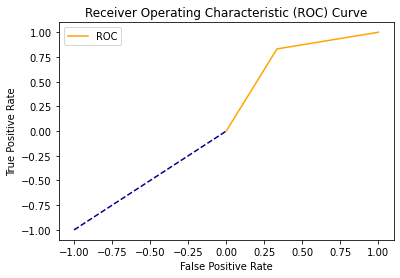



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 75.2%
Difference between accuracy_score and cross validation score is : -0.37150023727205905


------------------------------------------X---------------------------------------------


DecisionTreeClassifier(ccp_alpha=0.0, class_weight=None, criterion='gini',
                       max_depth=None, max_features=None, max_leaf_nodes=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, presort='deprecated',
                       random_state=None, splitter='best')
Accuracy on Training Set: 100.0%

 Accuracy on Testing Set:
___________________________
85.23%


Confusion_Matrix
________________
[[128  22]
 [ 22 126]]


Classification_Report
_____________________
              precision    recall  f1-score   support

           0       0.85

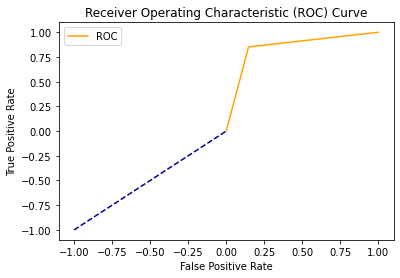



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 82.33%
Difference between accuracy_score and cross validation score is : 2.9026280704133


------------------------------------------X---------------------------------------------


RandomForestClassifier(bootstrap=True, ccp_alpha=0.0, class_weight=None,
                       criterion='gini', max_depth=None, max_features='auto',
                       max_leaf_nodes=None, max_samples=None,
                       min_impurity_decrease=0.0, min_impurity_split=None,
                       min_samples_leaf=1, min_samples_split=2,
                       min_weight_fraction_leaf=0.0, n_estimators=100,
                       n_jobs=None, oob_score=False, random_state=None,
                       verbose=0, warm_start=False)
Accuracy on Training Set: 100.0%

 Accuracy on Testing Set:
___________________________
89.26%


Confusion_Matrix
________________
[[132  18]
 [ 14 134]]


Classi

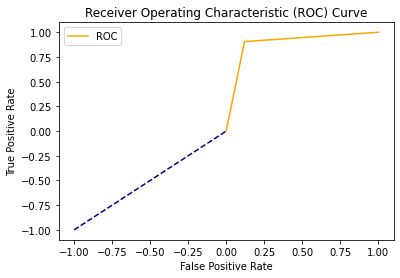



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 87.71%
Difference between accuracy_score and cross validation score is : 1.5522111495265847


------------------------------------------X---------------------------------------------


GradientBoostingClassifier(ccp_alpha=0.0, criterion='friedman_mse', init=None,
                           learning_rate=0.1, loss='deviance', max_depth=3,
                           max_features=None, max_leaf_nodes=None,
                           min_impurity_decrease=0.0, min_impurity_split=None,
                           min_samples_leaf=1, min_samples_split=2,
                           min_weight_fraction_leaf=0.0, n_estimators=100,
                           n_iter_no_change=None, presort='deprecated',
                           random_state=None, subsample=1.0, tol=0.0001,
                           validation_fraction=0.1, verbose=0,
                           warm_start=False)
Accuracy 

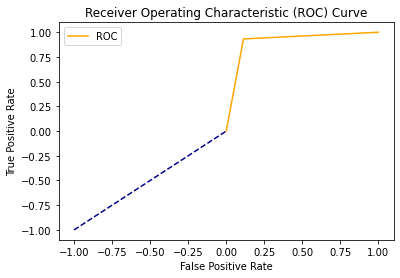



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 87.04%
Difference between accuracy_score and cross validation score is : 3.902786251779517


------------------------------------------X---------------------------------------------


KNeighborsClassifier(algorithm='auto', leaf_size=30, metric='minkowski',
                     metric_params=None, n_jobs=None, n_neighbors=5, p=2,
                     weights='uniform')
Accuracy on Training Set: 72.61%

 Accuracy on Testing Set:
___________________________
66.11%


Confusion_Matrix
________________
[[ 54  96]
 [  5 143]]


Classification_Report
_____________________
              precision    recall  f1-score   support

           0       0.92      0.36      0.52       150
           1       0.60      0.97      0.74       148

    accuracy                           0.66       298
   macro avg       0.76      0.66      0.63       298
weighted avg       0.76      0.66      0.63     

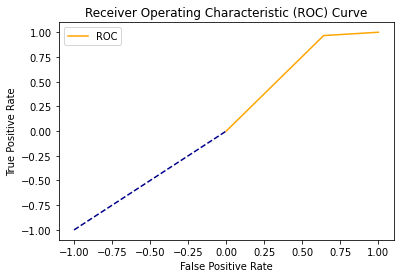



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 65.73%
Difference between accuracy_score and cross validation score is : 0.37692359840011136


------------------------------------------X---------------------------------------------


SVC(C=1.0, break_ties=False, cache_size=200, class_weight=None, coef0=0.0,
    decision_function_shape='ovr', degree=3, gamma='scale', kernel='rbf',
    max_iter=-1, probability=False, random_state=None, shrinking=True,
    tol=0.001, verbose=False)
Accuracy on Training Set: 95.97%

 Accuracy on Testing Set:
___________________________
85.23%


Confusion_Matrix
________________
[[123  27]
 [ 17 131]]


Classification_Report
_____________________
              precision    recall  f1-score   support

           0       0.88      0.82      0.85       150
           1       0.83      0.89      0.86       148

    accuracy                           0.85       298
   macro avg       0.85      0.85    

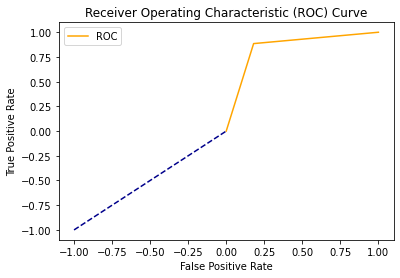



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 85.09%
Difference between accuracy_score and cross validation score is : 0.14846451088061485


------------------------------------------X---------------------------------------------


GaussianNB(priors=None, var_smoothing=1e-09)
Accuracy on Training Set: 74.2%

 Accuracy on Testing Set:
___________________________
77.52%


Confusion_Matrix
________________
[[100  50]
 [ 17 131]]


Classification_Report
_____________________
              precision    recall  f1-score   support

           0       0.85      0.67      0.75       150
           1       0.72      0.89      0.80       148

    accuracy                           0.78       298
   macro avg       0.79      0.78      0.77       298
weighted avg       0.79      0.78      0.77       298



ROC_AUC Curve
_____________
ROC_AUC score : 0.7759009009009009
Plotting


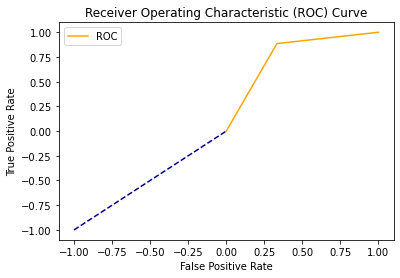



Computing Cross_Validation Score
________________________________
Cross Validation Score of the model is : 73.46%
Difference between accuracy_score and cross validation score is : 4.057578017309567


------------------------------------------X---------------------------------------------




In [35]:
models = [LR,DT,RF,GBR,KN,SV,GNB]

for i in models:
    print (i)
    i.fit(X_train, y_train)
    pred = i.predict(X_test)
    print("Accuracy on Training Set: {}%".format(round(i.score(X_train, y_train)*100, 2)))
    print('\n Accuracy on Testing Set:')
    print('___________________________')
    print("{}%".format(round(accuracy_score(y_test, pred)*100,2)))
    print('\n')
    print('Confusion_Matrix')
    print('________________')
    print(confusion_matrix(y_test, pred))
    print('\n')
    print('Classification_Report')
    print('_____________________')
    print(classification_report(y_test, pred))
    print('\n')
    print('ROC_AUC Curve')
    print('_____________')
    print('ROC_AUC score :',roc_auc_score(y_test,pred))
    print('Plotting')
    fpr, tpr, thresholds = roc_curve(y_test,pred)
    plot_roc_curve(fpr, tpr)
    print('\n')
    print('Computing Cross_Validation Score')
    print('________________________________')
    cvs = cross_val_score(i,X_res,y_res,cv=5)
    print('Cross Validation Score of the model is :',"{}%".format(round(cvs.mean()*100,2)))
    print('Difference between accuracy_score and cross validation score is :',(accuracy_score(y_test,pred)*100)-(cvs.mean()*100))
    print('\n')
    print('------------------------------------------X---------------------------------------------')
    print('\n')

**Observation :**

1. We see classification model - KNeighbors_Classifier has lowest accuracy score of 66.1% while GradientBoostingClassifier has highest accuracy score of 90.94% .
2. But in SVM classification we see that difference between accuracy score and cross validation score is least among all i.e, 0.14 . Hence SVM is our best fitted Model .


# **Hyper-Parameter Tuning**

In [36]:
from sklearn.model_selection import GridSearchCV

In [37]:
parameter={'C': [0.1, 1, 10, 100, 1000], 
           'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
           'kernel': ['rbf']}

In [38]:
GCV=GridSearchCV(SVC(),parameter,cv=5)

In [39]:
GCV.fit(X_train,y_train)

GridSearchCV(cv=5, error_score=nan,
             estimator=SVC(C=1.0, break_ties=False, cache_size=200,
                           class_weight=None, coef0=0.0,
                           decision_function_shape='ovr', degree=3,
                           gamma='scale', kernel='rbf', max_iter=-1,
                           probability=False, random_state=None, shrinking=True,
                           tol=0.001, verbose=False),
             iid='deprecated', n_jobs=None,
             param_grid={'C': [0.1, 1, 10, 100, 1000],
                         'gamma': [1, 0.1, 0.01, 0.001, 0.0001],
                         'kernel': ['rbf']},
             pre_dispatch='2*n_jobs', refit=True, return_train_score=False,
             scoring=None, verbose=0)

In [40]:
GCV.best_params_      #To get best parameters

{'C': 10, 'gamma': 0.1, 'kernel': 'rbf'}

In [41]:
#Building Final_Model
Final_mod = SVC(C=10,gamma=0.1,kernel='rbf')
Final_mod.fit(X_train,y_train)
pred_svc=Final_mod.predict(X_test)
acc_final=accuracy_score(y_test,pred_svc)
print('Final_Accuracy is :')
print('___________________')
print(acc_final*100)

Final_Accuracy is :
___________________
93.6241610738255


**Our Model learnt almost 93.62% of accuracy**

In [43]:
print('Croos-Validation score of SVC is:',cross_val_score(Final_mod,X_res,y_res,cv=5).mean()*100)

Croos-Validation score of SVC is: 95.90581429507606


         ROC_AUC CURVE OF SVC
         _______________________________________


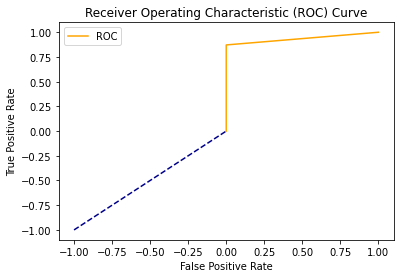

In [44]:
#Plotting ROC_AUC Curve
print('         ROC_AUC CURVE OF SVC')
print('         _______________________________________')
fpr, tpr, thresholds = roc_curve(y_test,pred_svc)
plot_roc_curve(fpr, tpr)

**Final_Prediction**

,Y Test,Prediction
0,0,0
1,0,1
2,1,1
3,1,1
4,0,0
5,0,0
6,1,1
7,1,1
8,1,1
9,1,1


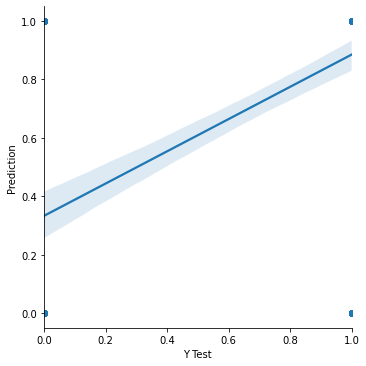

In [47]:
Fraud_Prediction = pd.DataFrame({'Y Test':y_test , 'Prediction':pred},columns=['Y Test','Prediction'])
sns.lmplot(x='Y Test',y='Prediction',data=Fraud_Prediction,palette='rainbow') #Plotting
Fraud_Prediction.head(20)

# **Saving Final Model**

In [48]:
# Saving the Predicted values in csv file

Fraud_Prediction.to_csv('Insurance_Claims- Fraud_Detection.csv')

In [49]:
# Dumping Data in pickle file.

import joblib
joblib.dump(Final_mod,'Insurance_Claims- Fraud_Detection.pkl')

['Insurance_Claims- Fraud_Detection.pkl']